<a href="https://colab.research.google.com/github/korkutanapa/ANOMALY_DETECTION_TDA_YAHOO_DATASET/blob/main/Effect_of_contextual_anomaly_w_frequency_in_a_sine_wave.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [110]:
# @title necessary libraries
# Install
#!pip install -U "numpy>=2.0,<2.3" "scipy>=1.11" ripser persim

In [111]:
# @title defining tda parameters
import numpy as np
import pandas as pd
from sklearn.neighbors import KDTree

# ================================
# USER SETTINGS
# ================================
CSV_PATH    = "/content/experiment5.csv"   # <<< CHANGE THIS
VALUE_COL   = "y"        # column with the time series values
window_size = 10          # FIXED window size (your choice)
time_delay  = 1          # fixed = 1

# ================================
# 1. READ CSV
# ================================
df = pd.read_csv(CSV_PATH)

print("CSV loaded successfully.")
print("Shape:", df.shape)
print("Columns:", df.columns.tolist())

# Extract series as numpy array
y = df[VALUE_COL].astype(float).to_numpy()
N = len(y)


# ================================
# 2. TAKENS EMBEDDING
# ================================
def takens_embedding(x, m, tau):
    """
    Build Takens embedding of a 1D time series x
    with dimension m and delay tau.

    Returns an array of shape (M, m) or None if
    there are not enough points.
    """
    M = len(x) - (m - 1) * tau
    if M <= 0:
        return None
    emb = np.zeros((M, m))
    for i in range(m):
        emb[:, i] = x[i * tau : i * tau + M]
    return emb


# ================================
# 3. FNN RATIO
# ================================
def compute_fnn_ratio(x, m, tau, R_tol=10.0, A_tol=2.0):
    """
    Robust False Nearest Neighbors (FNN) implementation.
    Fixes all broadcasting issues by strict index alignment.
    """

    N = len(x)

    # Number of valid vectors for dimension m and m+1
    M_m   = N - (m - 1) * tau
    M_mp1 = N - m * tau

    if M_m <= 2 or M_mp1 <= 2:
        return np.nan

    # Embeddings
    emb_m   = takens_embedding(x, m, tau)      # shape (M_m, m)
    emb_mp1 = takens_embedding(x, m + 1, tau)  # shape (M_mp1, m+1)

    # We must truncate to SAME length
    M = min(M_m, M_mp1)
    emb_m   = emb_m[:M]
    emb_mp1 = emb_mp1[:M]

    # Nearest neighbor search in m-dim
    tree = KDTree(emb_m)
    dist, idx = tree.query(emb_m, k=2)

    Rm = dist[:, 1]     # nearest neighbor distance
    j  = idx[:, 1]      # neighbor index

    # Properly aligned distance in (m+1)th coordinate
    x_i = x[m * tau : m * tau + M]
    x_j = x[j + m * tau]

    delta = np.abs(x_i - x_j)

    # Kennel criteria
    fnn_1 = delta / (Rm + 1e-12) > R_tol
    fnn_2 = np.sqrt(Rm**2 + delta**2) / np.std(x) > A_tol

    fnn = np.logical_or(fnn_1, fnn_2)

    return np.mean(fnn)


# ================================
# 4. FNN SCAN OVER m
# ================================
m_range = range(1, min(20, window_size - 1))
fnn_ratios = []

print("\n--- FNN scan over embedding dimension m ---")
for m in m_range:
    r = compute_fnn_ratio(y, m, time_delay)
    fnn_ratios.append(r)
    print(f"m = {m:2d}  ->  FNN ratio = {r:.4f}")

fnn_ratios = np.array(fnn_ratios)


# ================================
# 5. SELECT OPTIMAL DIMENSION
# ================================
threshold = 0.01

valid_m = np.where(fnn_ratios < threshold)[0]

if len(valid_m) == 0:
    best_m = list(m_range)[np.nanargmin(fnn_ratios)]
    print("\n⚠️ No dimension reached FNN < 0.01.")
    print(f"Using minimum FNN at m = {best_m}")
else:
    best_m = list(m_range)[valid_m[0]]
    print(f"\n✅ Optimal embedding dimension found: m = {best_m}")

# ================================
# 6. CONSISTENCY CHECK WITH WINDOW SIZE
# ================================
if window_size <= (best_m - 1) * time_delay:
    print("\n❌ Window size is TOO SMALL for this embedding:")
    print("Increase window_size to at least:",
          (best_m - 1) * time_delay + 1)
else:
    print("\n✅ Window size is sufficient for this embedding.")

print("\nSummary:")
print(f"  best_m      = {best_m}")
print(f"  window_size = {window_size}")
print(f"  time_delay  = {time_delay}")


CSV loaded successfully.
Shape: (400, 4)
Columns: ['time', 'segment_id', 'frequency', 'y']

--- FNN scan over embedding dimension m ---
m =  1  ->  FNN ratio = 0.9398
m =  2  ->  FNN ratio = 0.1558
m =  3  ->  FNN ratio = 0.0202
m =  4  ->  FNN ratio = 0.0000
m =  5  ->  FNN ratio = 0.0000
m =  6  ->  FNN ratio = 0.0025
m =  7  ->  FNN ratio = 0.0051
m =  8  ->  FNN ratio = 0.0077

✅ Optimal embedding dimension found: m = 4

✅ Window size is sufficient for this embedding.

Summary:
  best_m      = 4
  window_size = 10
  time_delay  = 1


In [112]:
# @title persistence diagrams
import numpy as np
import pandas as pd
from ripser import ripser

# ============================================
# ASSUMED FROM PREVIOUS CELLS
# ============================================
# df          : already loaded DataFrame
# VALUE_COL   : column name of series (e.g., "y")
# window_size : integer
# time_delay  : integer
# best_m      : optimal embedding dimension from FNN scan

VALUE_COL = "y"     # or whatever you used
dimension = best_m  # embedding dimension

# Sanity check
assert window_size - (dimension - 1) * time_delay > 0, \
    "Choose smaller time_delay*dimension or larger window_size."


# ============================================
# 1. TAKENS EMBEDDING (WINDOW-BASED)
# ============================================
def takens_embed(window, time_delay, dimension):
    """
    Takens embedding on a 1D window.

    window      : 1D array of length W
    time_delay  : tau
    dimension   : m

    Returns an array of shape (M, m), where
      M = W - (m - 1)*tau
    """
    m = len(window) - (dimension - 1) * time_delay
    if m <= 0:
        raise ValueError("Takens parameters too large for this window.")
    return np.stack(
        [window[j:j + m * time_delay:time_delay] for j in range(dimension)],
        axis=1
    )




# ============================================
# 3. WINDOWED PERSISTENCE DIAGRAMS (SLIDING)
# ============================================
def compute_windowed_persistence_diagrams(df, maxdim=1):
    """
    Compute persistence diagrams for each sliding window.

    Returns:
        diagrams_per_window : list of dicts:
            [
              {
                "index": i,      # time index in df (end of window)
                "dgms":  [H0, H1, ..., H_maxdim]   # list of arrays
              },
              ...
            ]
    """
    if VALUE_COL not in df.columns:
        raise ValueError(f"{VALUE_COL} not found in df.")

    y = pd.to_numeric(df[VALUE_COL], errors="coerce").astype(float).to_numpy()
    n = len(y)

    diagrams_per_window = []

    for i in range(window_size - 1, n):
        # Take window [i-window_size+1, ..., i]
        w = y[i - window_size + 1 : i + 1]

        emb = takens_embed(w, time_delay, dimension)
        dgms = ripser(emb, maxdim=maxdim)["dgms"]  # list: [H0, H1, ..., H_maxdim]

        diagrams_per_window.append({
            "index": i,
            "dgms":  dgms
        })

    return diagrams_per_window


# ============================================
# 4. EXAMPLE USAGE
# ============================================
# Choose how far you want to go in homology (0 = components, 1 = loops, etc.)
maxdim = 1  # change to 0, 1, 2, ...


# Windowed diagrams
windowed_dgms = compute_windowed_persistence_diagrams(df, maxdim=maxdim)
print(f"\nComputed diagrams for {len(windowed_dgms)} windows.")
print("Example for last window:")
last = windowed_dgms[-1]
print("  index:", last["index"])
for dim, D in enumerate(last["dgms"]):
    print(f"  H{dim} diagram shape:", D.shape)



Computed diagrams for 391 windows.
Example for last window:
  index: 399
  H0 diagram shape: (7, 2)
  H1 diagram shape: (1, 2)


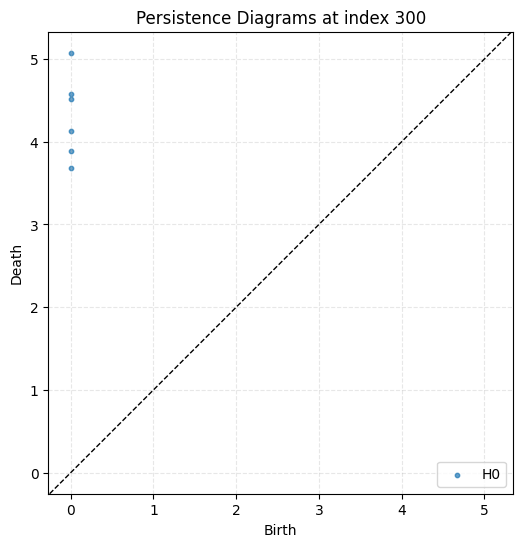

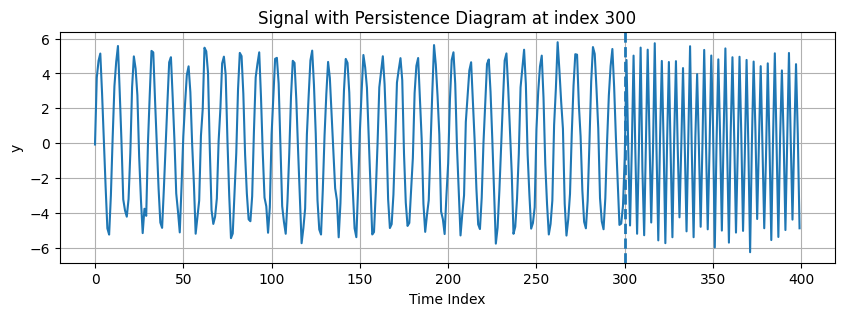

In [113]:
# @title plotting the persistence diagram
import numpy as np
import matplotlib.pyplot as plt

# ============================================
# 1) SAFE PLOT FUNCTION (handles inf / NaN)
# ============================================
def plot_persistence_diagrams(dgms, maxdim=None, title="Persistence Diagrams"):
    """
    Safe plotting for Ripser persistence diagrams.
    Handles inf / NaN values correctly.
    """

    if maxdim is None:
        maxdim = len(dgms) - 1

    finite_points = []

    # Collect only finite birth/death values
    for dim in range(min(maxdim + 1, len(dgms))):
        D = np.asarray(dgms[dim])
        if D.size == 0:
            continue
        mask = np.isfinite(D[:, 0]) & np.isfinite(D[:, 1])
        if np.any(mask):
            finite_points.append(D[mask])

    if len(finite_points) == 0:
        min_val, max_val = 0.0, 1.0
    else:
        finite_points = np.vstack(finite_points)
        min_val = float(np.min(finite_points))
        max_val = float(np.max(finite_points))

    # Small padding
    pad = 0.05 * (max_val - min_val + 1e-12)
    lo = min_val - pad
    hi = max_val + pad

    plt.figure(figsize=(6, 6))

    for dim in range(min(maxdim + 1, len(dgms))):
        D = np.asarray(dgms[dim])
        if D.size == 0:
            continue

        mask = np.isfinite(D[:, 0]) & np.isfinite(D[:, 1])
        if not np.any(mask):
            continue

        b = D[mask, 0]
        d = D[mask, 1]
        plt.scatter(b, d, s=10, alpha=0.7, label=f"H{dim}")

    # Diagonal
    plt.plot([lo, hi], [lo, hi], "k--", linewidth=1)

    plt.xlabel("Birth")
    plt.ylabel("Death")
    plt.title(title)
    plt.legend()
    plt.axis("equal")
    plt.xlim(lo, hi)
    plt.ylim(lo, hi)
    plt.grid(True, linestyle="--", alpha=0.3)
    plt.show()


# ============================================
# 2) LOOKUP: GET DGMS FOR ANY TARGET INDEX
# ============================================
def get_diagrams_at_index(windowed_dgms, target_index):
    """
    Returns dgms for the window that ends at target_index.
    """
    for item in windowed_dgms:
        if item["index"] == target_index:
            return item["dgms"]
    raise ValueError(f"No persistence diagram found for index {target_index}")


# ============================================
# 3) (OPTIONAL) PLOT SIGNAL WITH MARKED INDEX
# ============================================
def plot_signal_with_pd_index(df, value_col, t):
    y = pd.to_numeric(df[value_col], errors="coerce").astype(float).values

    plt.figure(figsize=(10, 3))
    plt.plot(y)
    plt.axvline(t, linestyle="--", linewidth=2)
    plt.title(f"Signal with Persistence Diagram at index {t}")
    plt.xlabel("Time Index")
    plt.ylabel(value_col)
    plt.grid(True)
    plt.show()


# ============================================
# 4) EXAMPLE: SHOW PD FOR ANY WANTED INDEX
# ============================================
# You already have:
# maxdim, df, windowed_dgms

# pick the index you want:
target_index = 300   # <-- change this to whatever index you want

# get its diagrams:
dgms_t = get_diagrams_at_index(windowed_dgms, target_index)

# plot the persistence diagram at that index:
plot_persistence_diagrams(
    dgms_t,
    maxdim=maxdim,
    title=f"Persistence Diagrams at index {target_index}"
)

# also show where it is on the signal (optional)
VALUE_COL = "y"  # or your column name
plot_signal_with_pd_index(df, VALUE_COL, target_index)


In [114]:
# @title
import os
import numpy as np
import matplotlib.pyplot as plt
import imageio.v2 as imageio

# If missing:
# !pip -q install imageio imageio-ffmpeg

# ------------------------------------------------------------
# 1) Compute GLOBAL limits (same axes for every frame)
# ------------------------------------------------------------
def compute_global_limits(windowed_dgms, maxdim=1):
    finite = []
    for item in windowed_dgms:
        dgms = item["dgms"]
        for dim in range(min(maxdim + 1, len(dgms))):
            D = np.asarray(dgms[dim])
            if D.size == 0:
                continue
            mask = np.isfinite(D[:, 0]) & np.isfinite(D[:, 1])
            if np.any(mask):
                finite.append(D[mask])

    if len(finite) == 0:
        lo, hi = 0.0, 1.0
    else:
        finite = np.vstack(finite)
        lo = float(np.min(finite))
        hi = float(np.max(finite))

    pad = 0.05 * (hi - lo + 1e-12)
    return lo - pad, hi + pad


# ------------------------------------------------------------
# 2) Plot ONE frame with fixed layout (same pixel size always)
# ------------------------------------------------------------
def plot_pd_frame(dgms, maxdim, lo, hi, title, out_path,
                  fig_inches=(6, 6), dpi=160):
    fig = plt.figure(figsize=fig_inches, dpi=dpi)

    # Fixed axes rectangle: [left, bottom, width, height]
    ax = fig.add_axes([0.12, 0.12, 0.80, 0.80])

    for dim in range(min(maxdim + 1, len(dgms))):
        D = np.asarray(dgms[dim])
        if D.size == 0:
            continue
        mask = np.isfinite(D[:, 0]) & np.isfinite(D[:, 1])
        if not np.any(mask):
            continue
        ax.scatter(D[mask, 0], D[mask, 1], s=10, alpha=0.7, label=f"H{dim}")

    ax.plot([lo, hi], [lo, hi], "k--", linewidth=1)

    ax.set_xlim(lo, hi)
    ax.set_ylim(lo, hi)
    ax.set_xlabel("Birth")
    ax.set_ylabel("Death")
    ax.set_title(title)

    # Keep geometry stable (avoid the "Ignoring fixed x limits..." warning)
    ax.set_aspect("equal", adjustable="box")

    ax.grid(True, linestyle="--", alpha=0.3)
    ax.legend(loc="upper left")

    # IMPORTANT: no bbox_inches="tight" -> keeps identical pixel size
    fig.savefig(out_path)
    plt.close(fig)


# ------------------------------------------------------------
# 3) Make movie (all frames same size)
# ------------------------------------------------------------
def make_pd_movie_fixed_size(
    windowed_dgms,
    maxdim=1,
    out_dir="pd_frames",
    movie_path="pd_movie_1fps.mp4",
    fps=1,
    start=None,
    end=None,
    fig_inches=(6, 6),
    dpi=160
):
    os.makedirs(out_dir, exist_ok=True)

    items = windowed_dgms
    if start is not None:
        items = [it for it in items if it["index"] >= start]
    if end is not None:
        items = [it for it in items if it["index"] <= end]
    items = sorted(items, key=lambda x: x["index"])

    lo, hi = compute_global_limits(items, maxdim=maxdim)

    frame_paths = []
    for k, item in enumerate(items):
        idx = item["index"]
        dgms = item["dgms"]

        frame_path = os.path.join(out_dir, f"frame_{k:05d}_idx_{idx}.png")
        plot_pd_frame(
            dgms=dgms,
            maxdim=maxdim,
            lo=lo,
            hi=hi,
            title=f"PD (H0,H1) @ index {idx}",
            out_path=frame_path,
            fig_inches=fig_inches,
            dpi=dpi
        )
        frame_paths.append(frame_path)

    # Write video; macro_block_size=16 avoids codec resizing issues
    with imageio.get_writer(movie_path, fps=fps, macro_block_size=16) as writer:
        for p in frame_paths:
            writer.append_data(imageio.imread(p))

    print("Frames saved in:", out_dir)
    print("Movie saved as:", movie_path)
    return frame_paths, movie_path


# -------------------
# RUN
# -------------------
frames, movie = make_pd_movie_fixed_size(
    windowed_dgms=windowed_dgms,
    maxdim=maxdim,              # usually 1
    out_dir="pd_frames",
    movie_path="pd_movie_1fps.mp4",
    fps=1,                      # 1 second per plot
    start=None,                 # or e.g. 100
    end=None,                   # or e.g. 300
    fig_inches=(6, 6),
    dpi=160
)


Frames saved in: pd_frames
Movie saved as: pd_movie_1fps.mp4


In [115]:
import numpy as np
import pandas as pd

# ================================
# USER PARAMETERS
# ================================
VALUE_COL = "y"         # time series column
LABEL_COL = "anomaly"   # optional, may not exist

_EPS = 1e-12


# ================================
# 1. PERSISTENCE DIAGRAM UTILITIES
# ================================
def _clean_diag(diag):
    """
    Clean diagram: remove NaNs, infs, and points with d <= b.
    Returns array of shape (n, 2).
    """
    if diag is None:
        return np.empty((0, 2), dtype=float)
    arr = np.asarray(diag, dtype=float)
    if arr.ndim != 2 or arr.shape[1] != 2 or arr.size == 0:
        return np.empty((0, 2), dtype=float)
    b, d = arr[:, 0], arr[:, 1]
    mask = np.isfinite(b) & np.isfinite(d) & (d > b)
    if not np.any(mask):
        return np.empty((0, 2), dtype=float)
    return np.stack([b[mask], d[mask]], axis=1)


def _lifetimes(diag):
    """
    Lifetimes L = d - b for cleaned diagram.
    """
    arr = _clean_diag(diag)
    if arr.size == 0:
        return np.empty(0, dtype=float)
    return np.maximum(arr[:, 1] - arr[:, 0], 0.0)


def _safe_div(a, b):
    return float(a) / float(b + _EPS)


try:
    _trapz = np.trapezoid
except AttributeError:
    _trapz = np.trapz


def _auc_tri_max(diag):
    """
    Your 'triangular max' persistence landscape AUC (1st layer).
    """
    arr = _clean_diag(diag)
    if arr.size == 0:
        return 0.0
    b_all, d_all = arr[:, 0], arr[:, 1]

    grid = np.linspace(b_all.min(), d_all.max(), 64)
    lam1 = np.zeros_like(grid)

    for b, d in arr:
        m = 0.5 * (b + d)
        h = 0.5 * (d - b)
        if h <= 0:
            continue

        left = (grid >= b) & (grid <= m)
        right = (grid >= m) & (grid <= d)

        lam1[left] = np.maximum(
            lam1[left],
            (grid[left] - b) * (h / max(m - b, _EPS))
        )
        lam1[right] = np.maximum(
            lam1[right],
            (d - grid[right]) * (h / max(d - m, _EPS))
        )

    return float(_trapz(lam1, grid))


def _persistence_entropy(diag):
    """
    Persistence entropy based on lifetimes.
    """
    L = _lifetimes(diag)
    if L.size == 0:
        return 0.0
    S = L.sum()
    if S <= 0:
        return 0.0
    p = L / S
    return float(-np.sum(p * np.log(p + _EPS)))


def _gini_from_lifetimes(L):
    L = np.sort(L)
    n = len(L)
    if n == 0:
        return 0.0
    S = L.sum()
    if S <= 0:
        return 0.0
    cumL = np.cumsum(L)
    return float(1 + 1/n - 2*np.sum(cumL/(n*S)))


def _tail_share_q(diag, q):
    L = _lifetimes(diag)
    if L.size == 0:
        return 0.0
    qv = np.quantile(L, q)
    return _safe_div(L[L >= qv].sum(), L.sum())


def _sum_centroid_radial(diag):
    """
    Your 'sum centroid' using radial coordinate (b+d)/sqrt(2) weighted by L.
    """
    arr = _clean_diag(diag)
    if arr.size == 0:
        return 0.0
    b, d = arr[:, 0], arr[:, 1]
    L = np.maximum(d - b, 0.0)
    if L.sum() <= 0:
        return 0.0
    radial = (b + d) / np.sqrt(2.0)
    return _safe_div(np.sum(np.abs(radial) * L), L.sum())


def _pete(diag, p=1.6, q=0.5):
    """
    PETE feature: sum(L^p * |radial|^q) / sum(L)
    """
    arr = _clean_diag(diag)
    if arr.size == 0:
        return 0.0
    b, d = arr[:, 0], arr[:, 1]
    L = np.maximum(d - b, 0.0)
    S = L.sum()
    if S <= 0:
        return 0.0
    radial = (b + d) / np.sqrt(2.0)
    return _safe_div(np.sum((L**p) * (np.abs(radial)**q)), S)


def _lifetimes_stats(diag):
    """
    Basic stats on lifetimes, returns dict.
    """
    L = _lifetimes(diag)
    if L.size == 0:
        return {
            "count": 0,
            "sum": 0.0,
            "mean": 0.0,
            "median": 0.0,
            "std": 0.0,
            "min": 0.0,
            "max": 0.0,
            "L1": 0.0,
            "L2": 0.0,
            "Linf": 0.0,
        }
    return {
        "count": int(L.size),
        "sum": float(L.sum()),
        "mean": float(L.mean()),
        "median": float(np.median(L)),
        "std": float(L.std(ddof=0)),
        "min": float(L.min()),
        "max": float(L.max()),
        "L1": float(np.sum(np.abs(L))),
        "L2": float(np.sqrt(np.sum(L**2))),
        "Linf": float(np.max(np.abs(L))),
    }


def _birth_death_stats(diag):
    """
    Stats on birth and death coordinates.
    """
    arr = _clean_diag(diag)
    if arr.size == 0:
        return {
            "mean_birth": 0.0,
            "mean_death": 0.0,
            "std_birth": 0.0,
            "std_death": 0.0,
        }
    b, d = arr[:, 0], arr[:, 1]
    return {
        "mean_birth": float(b.mean()),
        "mean_death": float(d.mean()),
        "std_birth": float(b.std(ddof=0)),
        "std_death": float(d.std(ddof=0)),
    }


def _diag_distance_stats(diag):
    """
    Distance to diagonal: (d - b)/sqrt(2) for each point.
    """
    arr = _clean_diag(diag)
    if arr.size == 0:
        return {
            "mean_diag_dist": 0.0,
            "max_diag_dist": 0.0,
            "sum_diag_dist": 0.0,
        }
    b, d = arr[:, 0], arr[:, 1]
    dist = (d - b) / np.sqrt(2.0)
    return {
        "mean_diag_dist": float(dist.mean()),
        "max_diag_dist": float(dist.max()),
        "sum_diag_dist": float(dist.sum()),
    }


def _centroid_xy(diag):
    """
    Weighted centroid in (b,d) plane with weights=L.
    """
    arr = _clean_diag(diag)
    if arr.size == 0:
        return {"centroid_x": 0.0, "centroid_y": 0.0}
    b, d = arr[:, 0], arr[:, 1]
    L = np.maximum(d - b, 0.0)
    S = L.sum()
    if S <= 0:
        return {"centroid_x": 0.0, "centroid_y": 0.0}
    cx = float(np.sum(b * L) / S)
    cy = float(np.sum(d * L) / S)
    return {"centroid_x": cx, "centroid_y": cy}


def _lifetimes_quantiles(diag):
    L = _lifetimes(diag)
    if L.size == 0:
        return {
            "q50": 0.0,
            "q75": 0.0,
            "q90": 0.0,
            "q95": 0.0,
            "q99": 0.0,
        }
    return {
        "q50": float(np.quantile(L, 0.50)),
        "q75": float(np.quantile(L, 0.75)),
        "q90": float(np.quantile(L, 0.90)),
        "q95": float(np.quantile(L, 0.95)),
        "q99": float(np.quantile(L, 0.99)),
    }


def _carlsson_coordinates(diag):
    """
    Carlsson coordinates f1..f5.
    """
    arr = _clean_diag(diag)
    if arr.size == 0:
        return {f"f{k}": 0.0 for k in range(1, 6)}
    b, d = arr[:, 0], arr[:, 1]
    L = np.maximum(d - b, 0.0)
    S = L.sum()
    if S <= 0:
        return {f"f{k}": 0.0 for k in range(1, 6)}

    f1 = float(L.sum())
    f2 = float(np.sum(b * L))
    f3 = float(np.sum(d * L))
    f4 = float(np.sum(b**2 * L))
    f5 = float(np.sum(d**2 * L))
    return {"f1": f1, "f2": f2, "f3": f3, "f4": f4, "f5": f5}


# ================================
# 2. PER-DIMENSION FEATURE BUILDER
# ================================
def compute_features_for_diag(diag, prefix):
    """
    Compute a rich set of features for a single homology dimension.

    prefix: "H0_" or "H1_"
    """
    feats = {}

    # Lifetimes stats
    L_stats = _lifetimes_stats(diag)
    for k, v in L_stats.items():
        feats[f"{prefix}{k}_lifetime"] = v

    # Betti number = count
    feats[f"{prefix}betti"] = float(L_stats["count"])

    # Energy-based
    L1 = L_stats["L1"]
    L2 = L_stats["L2"]
    Linf = L_stats["Linf"]
    feats[f"{prefix}L1_norm"] = L1
    feats[f"{prefix}L2_norm"] = L2
    feats[f"{prefix}Linf_norm"] = Linf
    feats[f"{prefix}energy_concentration"] = _safe_div(L2, L1)
    feats[f"{prefix}dominance_share"] = _safe_div(Linf, L1)

    # Entropy
    feats[f"{prefix}persistence_entropy"] = _persistence_entropy(diag)

    # Birth/death stats
    BD_stats = _birth_death_stats(diag)
    for k, v in BD_stats.items():
        feats[f"{prefix}{k}"] = v

    # Distance to diagonal
    D_stats = _diag_distance_stats(diag)
    for k, v in D_stats.items():
        feats[f"{prefix}{k}"] = v

    # Centroid XY
    Cxy = _centroid_xy(diag)
    for k, v in Cxy.items():
        feats[f"{prefix}{k}"] = v

    # Lifetimes quantiles + tail
    Q = _lifetimes_quantiles(diag)
    for k, v in Q.items():
        feats[f"{prefix}{k}"] = v

    tail90 = _tail_share_q(diag, 0.90)
    tail95 = _tail_share_q(diag, 0.95)
    tail80 = _tail_share_q(diag, 0.80)
    feats[f"{prefix}tail_share_q90"] = tail90
    feats[f"{prefix}tail_share_q95"] = tail95
    feats[f"{prefix}tail_share_q80"] = tail80
    feats[f"{prefix}tail_curvature_80_90"] = float(tail90 - tail80)
    feats[f"{prefix}tail_curvature_90_99"] = 0.0  # you can add similarly if desired

    # Gini
    L = _lifetimes(diag)
    feats[f"{prefix}gini"] = _gini_from_lifetimes(L)

    # Carlsson coordinates
    Cc = _carlsson_coordinates(diag)
    for k, v in Cc.items():
        feats[f"{prefix}Carlsson_{k}"] = v

    # --- Your special H0 AUC/PETE family (only make sense for H0 normally) ---
    # If prefix == "H0_", we add them:
    if prefix == "H0_":
        sumL = L_stats["sum"]
        feats["H0_ratio_auc_L1_to_sum"] = _safe_div(_auc_tri_max(diag), sumL)
        feats["H0_ratio_auc_to_max"] = _safe_div(_auc_tri_max(diag), L_stats["max"])
        feats["H0_ratio_auc_to_l2"] = _safe_div(_auc_tri_max(diag), L2)
        feats["H0_bottleneck"] = float(L_stats["max"])
        feats["H0_sum_centroid"] = _sum_centroid_radial(diag)
        feats["PETE_p1.6_q0.5"] = _pete(diag, p=1.6, q=0.5)
        feats["H0_energy_concentration"] = _safe_div(L2, sumL)
        feats["H0_dominance_share"] = _safe_div(Linf, sumL)
        feats["H0_tail_curvature_80_90"] = float(tail90 - tail80)
        feats["H0_centroid_to_energy"] = _safe_div(_sum_centroid_radial(diag), L2)
        feats["H0_gini"] = feats["H0_gini"]  # already there, kept for compatibility

    return feats


# ================================
# 3. CROSS-DIMENSION FEATURES (H1 vs H0)
# ================================
def compute_cross_dim_features(feats_H0, feats_H1):
    """
    Build features that combine H0 and H1 (ratios).
    """
    out = {}

    # Helper to get safely
    def g(d, k):
        return float(d.get(k, 0.0))

    # Energy ratio: H1 L2_norm / H0 L2_norm
    out["H1_to_H0_L2_energy_ratio"] = _safe_div(
        g(feats_H1, "H1_L2_norm"),
        g(feats_H0, "H0_L2_norm")
    )

    # Entropy ratio
    out["H1_to_H0_entropy_ratio"] = _safe_div(
        g(feats_H1, "H1_persistence_entropy"),
        g(feats_H0, "H0_persistence_entropy")
    )

    # Betti ratio
    out["H1_to_H0_betti_ratio"] = _safe_div(
        g(feats_H1, "H1_betti"),
        g(feats_H0, "H0_betti")
    )

    # Tail share ratio
    out["H1_to_H0_tail90_ratio"] = _safe_div(
        g(feats_H1, "H1_tail_share_q90"),
        g(feats_H0, "H0_tail_share_q90")
    )

    return out


# ================================
# 4. MAIN FEATURE EXTRACTOR
#    USING windowed_dgms
# ================================
def build_tda_feature_matrix_from_windowed(df, windowed_dgms, maxdim=1):
    """
    df           : original DataFrame with VALUE_COL
    windowed_dgms: list of {'index': i, 'dgms': [H0, H1, ...]}
    maxdim       : highest homology dimension in dgms (>=1 for H0+H1)

    Returns: DataFrame with:
        - point (time index)
        - y (value)
        - optional is_anomaly
        - many TDA features per window ending at each index
    """
    if VALUE_COL not in df.columns:
        raise ValueError(f"{VALUE_COL} not found in df.")

    y = pd.to_numeric(df[VALUE_COL], errors="coerce").astype(float).to_numpy()
    n = len(y)

    out = pd.DataFrame({
        "point": np.arange(n),
        "y": y
    })

    if LABEL_COL in df.columns:
        out["is_anomaly"] = df[LABEL_COL].astype(int).values

    # Collect all feature names by doing one dummy computation
    # on the last window (or first)
    sample = windowed_dgms[-1]
    dgms_sample = sample["dgms"]
    D0 = dgms_sample[0] if len(dgms_sample) > 0 else np.empty((0, 2))
    D1 = dgms_sample[1] if (maxdim >= 1 and len(dgms_sample) > 1) else np.empty((0, 2))

    feats_H0_sample = compute_features_for_diag(D0, "H0_")
    feats_H1_sample = compute_features_for_diag(D1, "H1_")
    cross_sample    = compute_cross_dim_features(feats_H0_sample, feats_H1_sample)

    all_feature_names = (
        list(feats_H0_sample.keys())
        + list(feats_H1_sample.keys())
        + list(cross_sample.keys())
    )

    # Initialize columns with NaN
    for name in all_feature_names:
        out[name] = np.nan

    # Fill per-window
    for item in windowed_dgms:
        idx = item["index"]      # time index (end of window)
        dgms = item["dgms"]

        D0 = dgms[0] if len(dgms) > 0 else np.empty((0, 2))
        D1 = dgms[1] if (maxdim >= 1 and len(dgms) > 1) else np.empty((0, 2))

        feats_H0 = compute_features_for_diag(D0, "H0_")
        feats_H1 = compute_features_for_diag(D1, "H1_")
        cross    = compute_cross_dim_features(feats_H0, feats_H1)

        merged = {}
        merged.update(feats_H0)
        merged.update(feats_H1)
        merged.update(cross)

        # assign to the index row
        for k, v in merged.items():
            out.at[idx, k] = v

    return out


In [116]:
maxdim = 1
windowed_dgms = compute_windowed_persistence_diagrams(df, maxdim=maxdim)

In [117]:
tda_features_df = build_tda_feature_matrix_from_windowed(df, windowed_dgms, maxdim=maxdim)
print(tda_features_df.head())
print(tda_features_df.columns)

   point         y  H0_count_lifetime  H0_sum_lifetime  H0_mean_lifetime  \
0      0 -0.075478                NaN              NaN               NaN   
1      1  3.757464                NaN              NaN               NaN   
2      2  4.729455                NaN              NaN               NaN   
3      3  5.144579                NaN              NaN               NaN   
4      4  2.854210                NaN              NaN               NaN   

   H0_median_lifetime  H0_std_lifetime  H0_min_lifetime  H0_max_lifetime  \
0                 NaN              NaN              NaN              NaN   
1                 NaN              NaN              NaN              NaN   
2                 NaN              NaN              NaN              NaN   
3                 NaN              NaN              NaN              NaN   
4                 NaN              NaN              NaN              NaN   

   H0_L1_lifetime  ...  H1_gini  H1_Carlsson_f1  H1_Carlsson_f2  \
0             NaN  

In [118]:
tda_features_df

,point,y,H0_count_lifetime,H0_sum_lifetime,H0_mean_lifetime,H0_median_lifetime,H0_std_lifetime,H0_min_lifetime,H0_max_lifetime,H0_L1_lifetime,...,H1_gini,H1_Carlsson_f1,H1_Carlsson_f2,H1_Carlsson_f3,H1_Carlsson_f4,H1_Carlsson_f5,H1_to_H0_L2_energy_ratio,H1_to_H0_entropy_ratio,H1_to_H0_betti_ratio,H1_to_H0_tail90_ratio
0,0,-0.075478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,3.757464,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,4.729455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,5.144579,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,2.854210,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,395,-4.389451,6.0,31.617093,5.269516,5.165887,4.117378,1.101161,9.507598,31.617093,...,0.0,3.527103,34.280634,46.721093,333.180442,618.881911,0.215322,-6.926459e-13,0.166667,3.325455
396,396,0.280094,6.0,31.834447,5.305741,5.165887,4.154621,1.101161,9.719203,31.834447,...,0.0,3.198158,32.135568,42.363784,322.902949,561.163669,0.193749,-6.934060e-13,0.166667,3.275417
397,397,4.535857,6.0,31.072724,5.178787,5.165887,4.097493,0.889325,9.497411,31.072724,...,0.0,2.998147,29.419380,38.408266,288.678288,492.035543,0.185348,-6.979941e-13,0.166667,3.271705
398,398,0.519305,6.0,30.321101,5.053517,4.975436,4.054170,0.889325,9.353761,30.321101,...,0.0,3.426216,32.168250,43.907207,302.023061,562.674016,0.215897,-7.037124e-13,0.166667,3.241595


In [119]:
filename = "features.csv"
tda_features_df.to_csv(filename, index=False)

determining which features are effective

In [120]:
import pandas as pd
import numpy as np

# 1. Load the dataset
df = pd.read_csv('features.csv')

# Exclude 'point' as it is an identifier
# We keep 'y' and all topological features
features_df = df.drop(columns=['point'])

# --- Part 1: Top 3 Max and Min for Each Feature (Values & Point Indices) ---
print("--- Top 3 Maximum and Minimum Values per Feature ---")

for col in features_df.columns:
    # --- Maximums ---
    # Find top 3 largest values
    largest = features_df[col].nlargest(3)
    top_3_max_vals = largest.values
    # Get the 'point' indices for these values
    # Note: features_df has the same index as df, so we can use the index to look up 'point' in df
    top_3_max_points = df.loc[largest.index, 'point'].values

    # --- Minimums ---
    # Find top 3 smallest values
    smallest = features_df[col].nsmallest(3)
    top_3_min_vals = smallest.values
    # Get the 'point' indices for these values
    top_3_min_points = df.loc[smallest.index, 'point'].values

    print(f"Feature: {col}")
    print(f"  Max 3 Values: {top_3_max_vals}")
    print(f"  Max 3 Points: {top_3_max_points}")
    print(f"  Min 3 Values: {top_3_min_vals}")
    print(f"  Min 3 Points: {top_3_min_points}")
    print("-" * 30)

--- Top 3 Maximum and Minimum Values per Feature ---
Feature: y
  Max 3 Values: [5.79527765 5.73723231 5.6314312 ]
  Max 3 Points: [262 317 192]
  Min 3 Values: [-6.26132531 -5.98588957 -5.76781314]
  Min 3 Points: [371 351 227]
------------------------------
Feature: H0_count_lifetime
  Max 3 Values: [6. 6. 6.]
  Max 3 Points: [ 9 10 11]
  Min 3 Values: [6. 6. 6.]
  Min 3 Points: [ 9 10 11]
------------------------------
Feature: H0_sum_lifetime
  Max 3 Values: [40.82926297 39.017555   36.7743814 ]
  Max 3 Points: [305 306 304]
  Min 3 Values: [22.2876575  23.07509589 23.12827706]
  Min 3 Points: [139 140 138]
------------------------------
Feature: H0_mean_lifetime
  Max 3 Values: [6.80487716 6.50292583 6.12906357]
  Max 3 Points: [305 306 304]
  Min 3 Values: [3.71460958 3.84584932 3.85471284]
  Min 3 Points: [139 140 138]
------------------------------
Feature: H0_median_lifetime
  Max 3 Values: [7.23972392 7.23972392 6.38790154]
  Max 3 Points: [305 306 304]
  Min 3 Values: [3.725

In [121]:
import pandas as pd
import numpy as np

# 1. Load the dataset
df = pd.read_csv('features.csv')

# Exclude 'point' as it is an identifier
features_df = df.drop(columns=['point'])

effective_features = []
print("--- Features where Extreme Points (Max/Min) are close to Point 300 (Index +/- 5) ---")

for col in features_df.columns:
    # --- MAX ---
    # Get top 3 largest values and their corresponding point indices
    largest = features_df[col].nlargest(3)
    max_points = df.loc[largest.index, 'point'].values

    # --- MIN ---
    # Get top 3 smallest values and their corresponding point indices
    smallest = features_df[col].nsmallest(3)
    min_points = df.loc[smallest.index, 'point'].values

    # Combine all extreme points to check
    extreme_points = np.concatenate([max_points, min_points])

    # Check if any point is in the range [295, 305] (300 +/- 5)
    points_close_to_300 = []
    for pt in extreme_points:
        if abs(pt - 300) <= 10:
            points_close_to_300.append(pt)

    # Remove duplicates
    points_close_to_300 = sorted(list(set(points_close_to_300)))

    # If any points match the condition, report the feature
    if len(points_close_to_300) > 0:
        effective_features.append(col)
        print(f"Feature: {col}")
        print(f"  Max 3 Points: {max_points}")
        print(f"  Min 3 Points: {min_points}")
        print(f"  -> Points close to 300 found: {points_close_to_300}")
        print("-" * 30)

print(f"\nTotal Effective Features: {len(effective_features)}")
print("Effective Features List:", effective_features)

--- Features where Extreme Points (Max/Min) are close to Point 300 (Index +/- 5) ---
Feature: H0_sum_lifetime
  Max 3 Points: [305 306 304]
  Min 3 Points: [139 140 138]
  -> Points close to 300 found: [np.int64(304), np.int64(305), np.int64(306)]
------------------------------
Feature: H0_mean_lifetime
  Max 3 Points: [305 306 304]
  Min 3 Points: [139 140 138]
  -> Points close to 300 found: [np.int64(304), np.int64(305), np.int64(306)]
------------------------------
Feature: H0_median_lifetime
  Max 3 Points: [305 306 304]
  Min 3 Points: [139 140 138]
  -> Points close to 300 found: [np.int64(304), np.int64(305), np.int64(306)]
------------------------------
Feature: H0_L1_lifetime
  Max 3 Points: [305 306 304]
  Min 3 Points: [139 140 138]
  -> Points close to 300 found: [np.int64(304), np.int64(305), np.int64(306)]
------------------------------
Feature: H0_L1_norm
  Max 3 Points: [305 306 304]
  Min 3 Points: [139 140 138]
  -> Points close to 300 found: [np.int64(304), np.int64

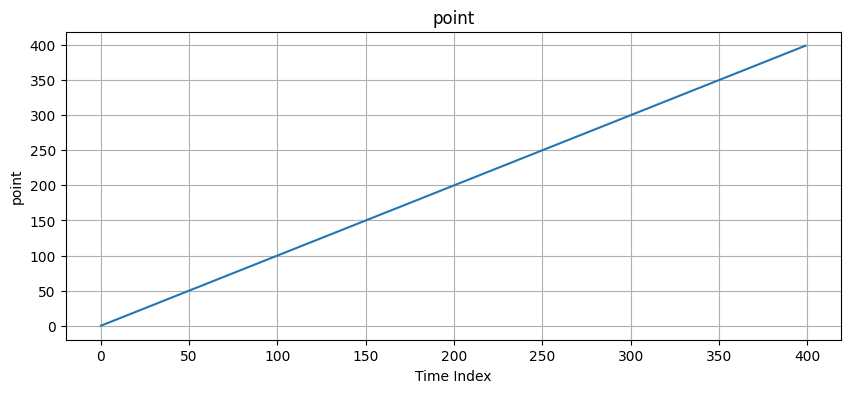

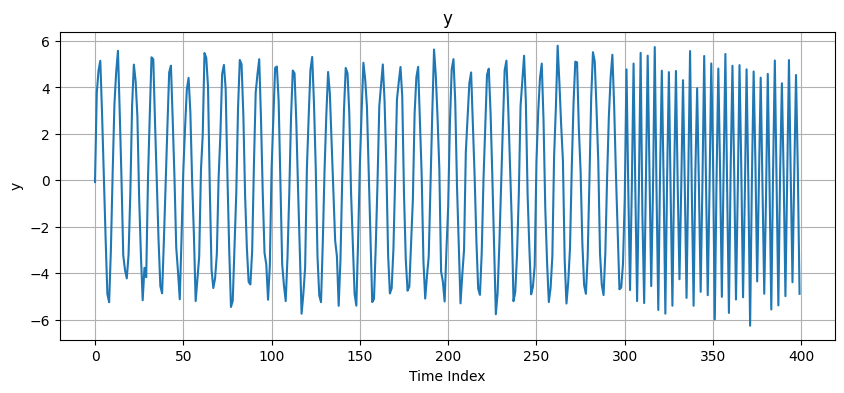

Skipping constant / empty column: H0_count_lifetime


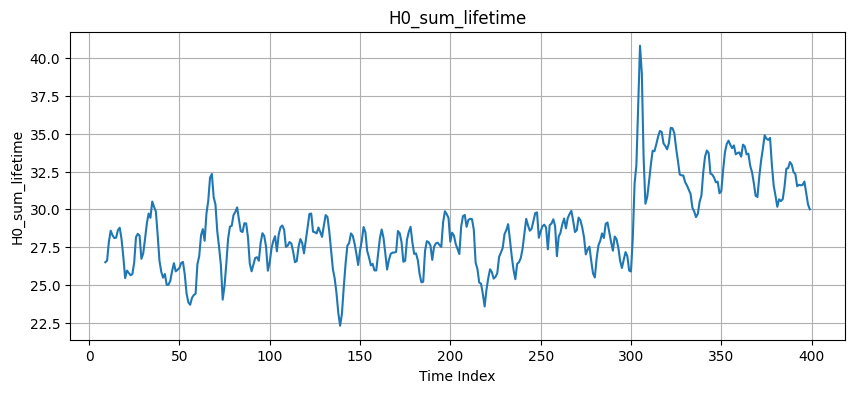

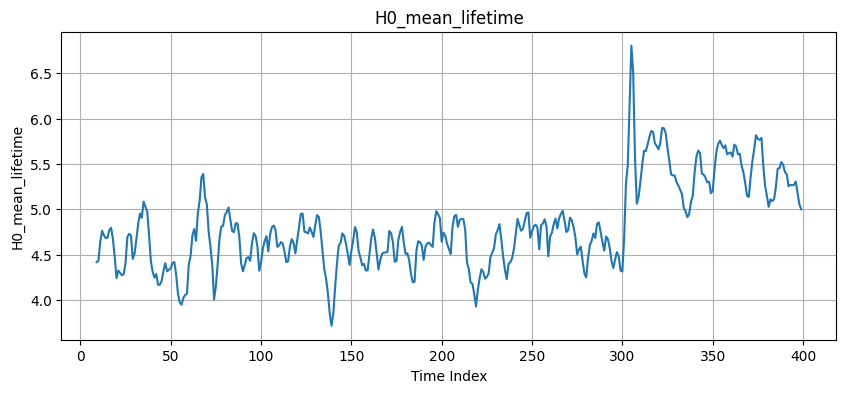

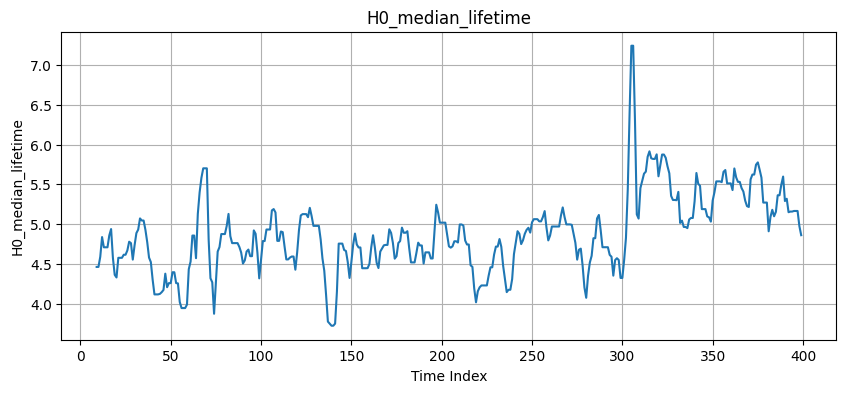

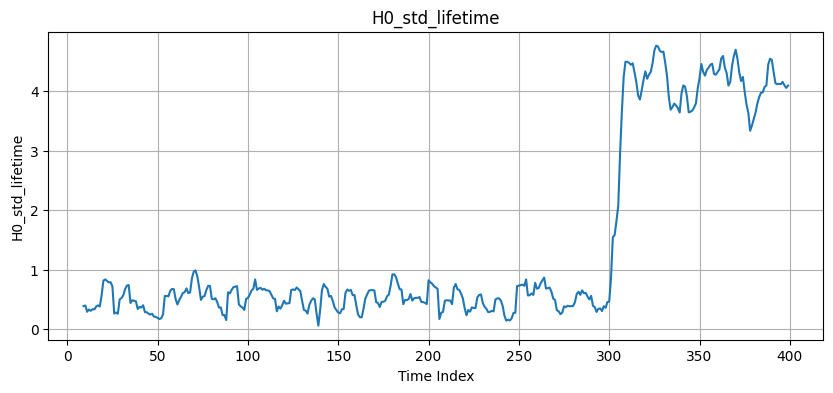

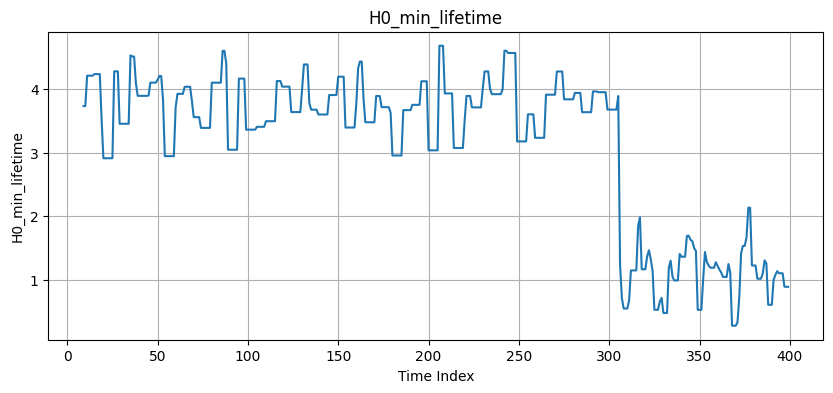

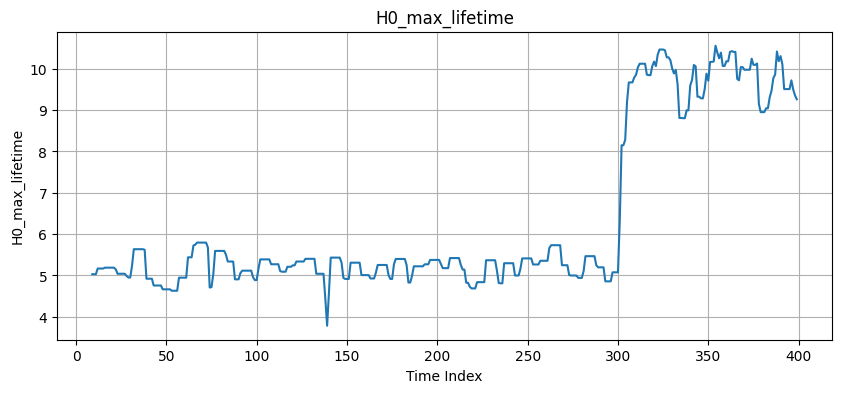

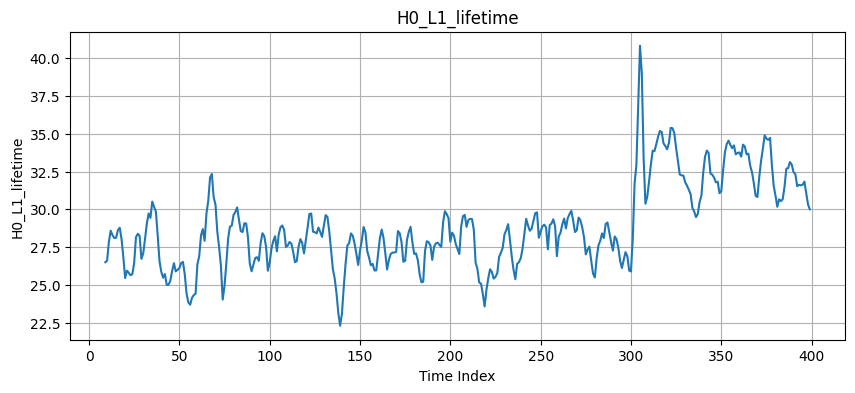

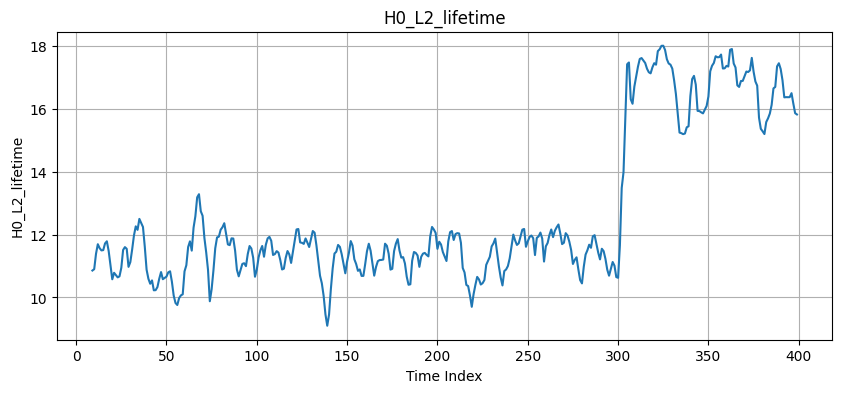

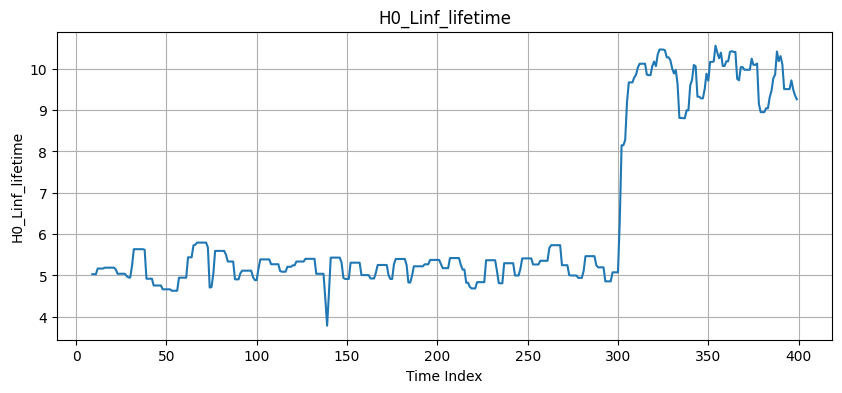

Skipping constant / empty column: H0_betti


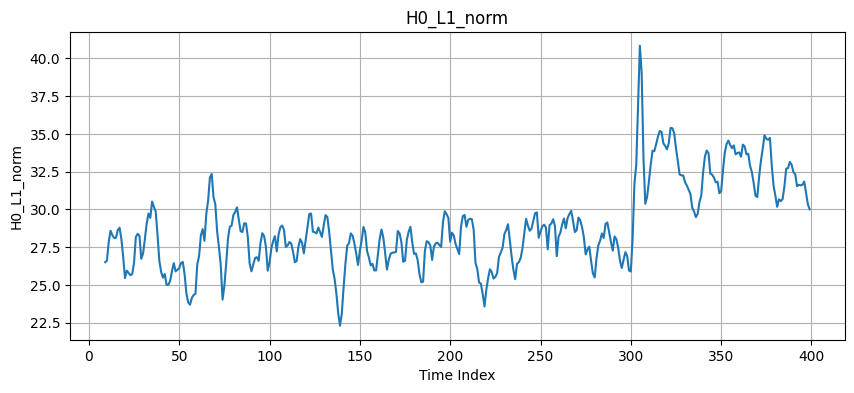

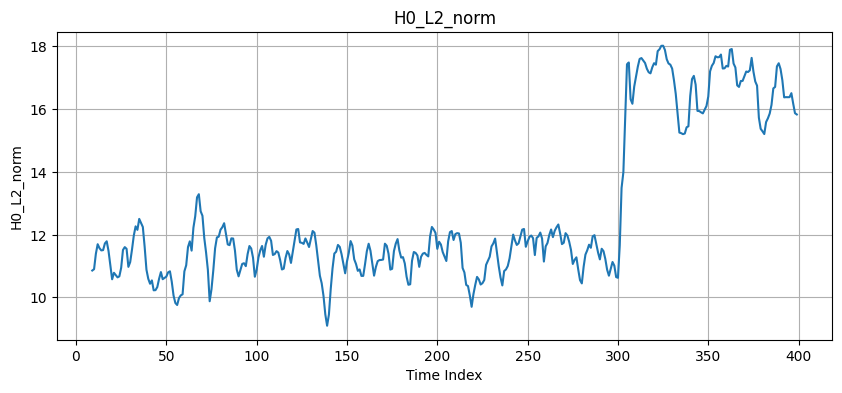

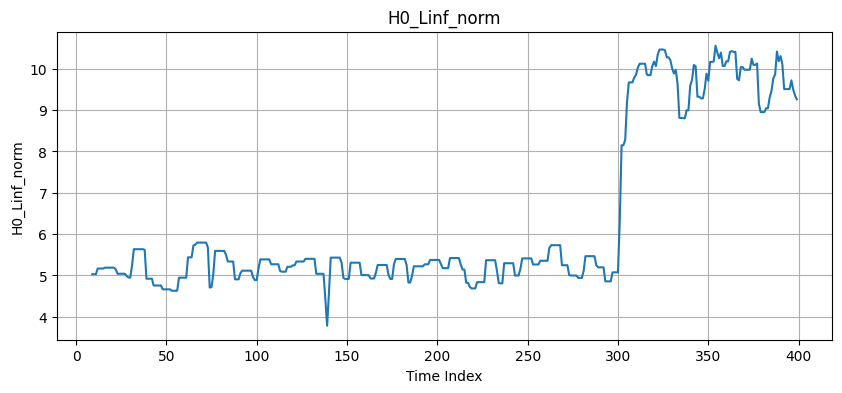

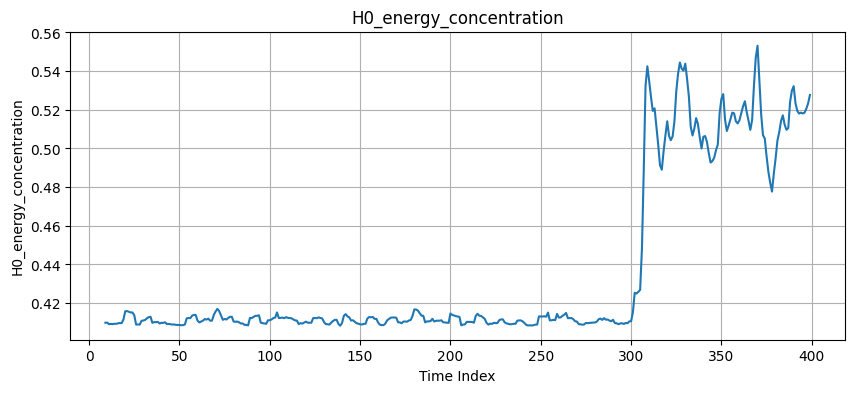

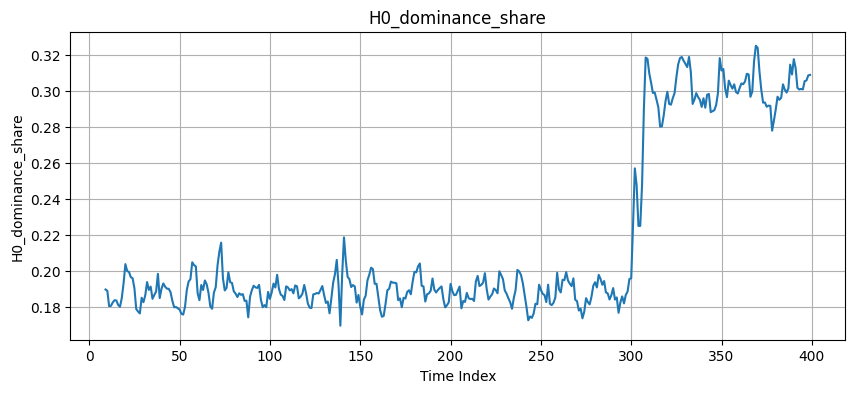

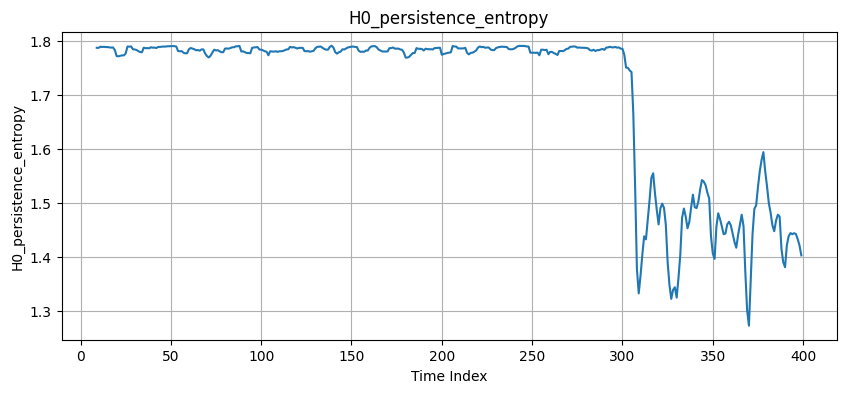

Skipping constant / empty column: H0_mean_birth


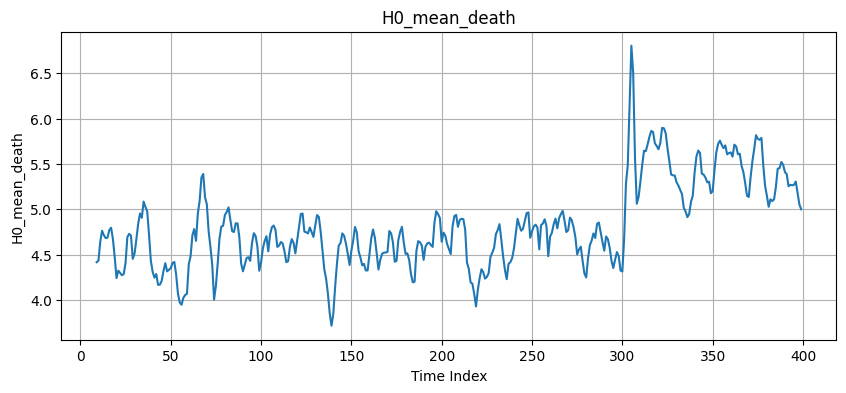

Skipping constant / empty column: H0_std_birth


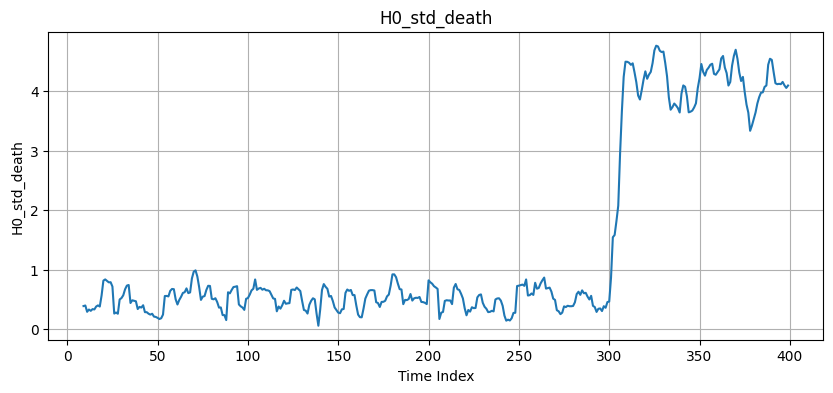

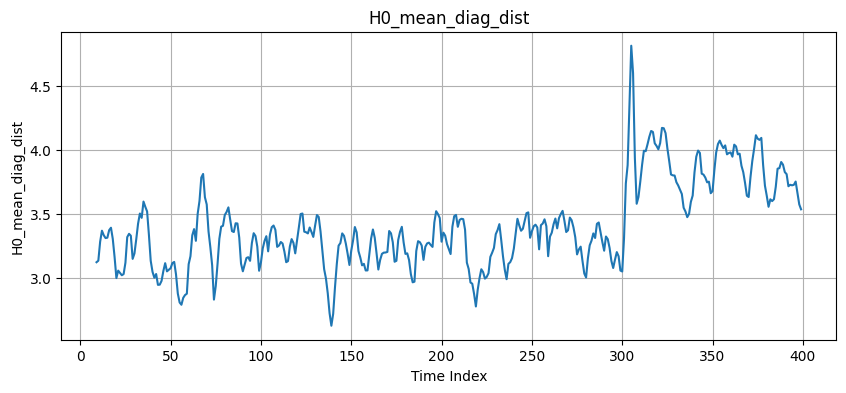

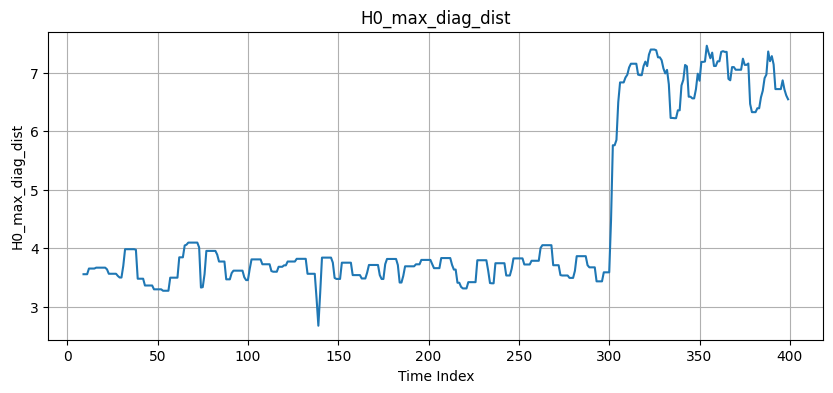

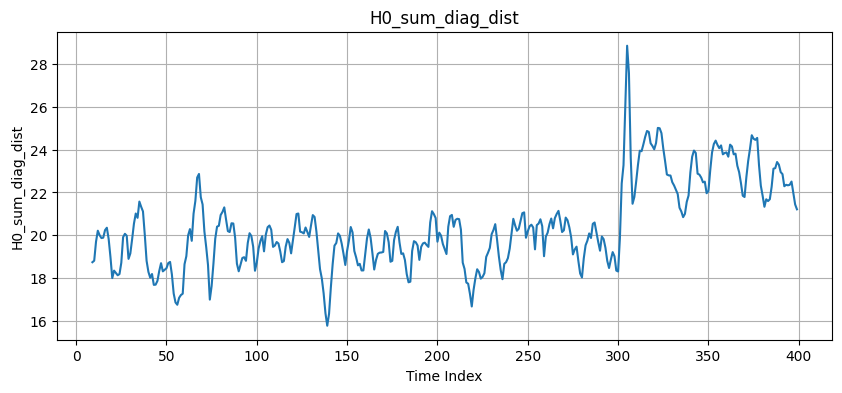

Skipping constant / empty column: H0_centroid_x


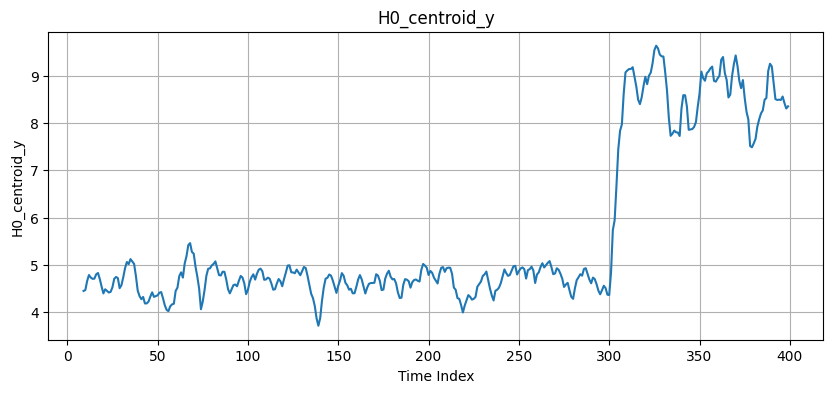

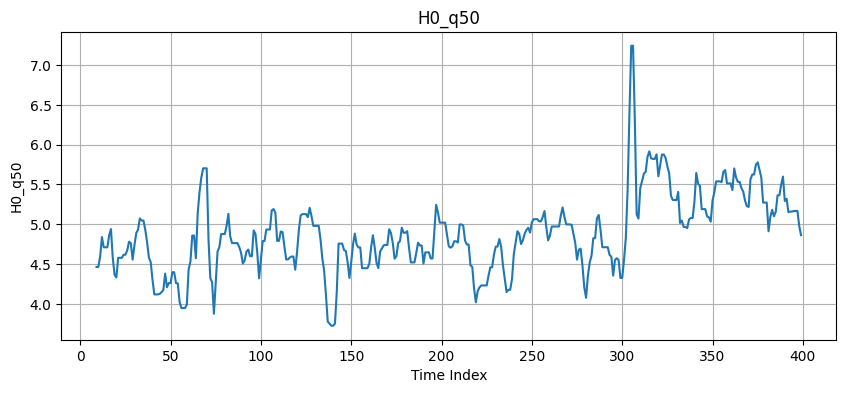

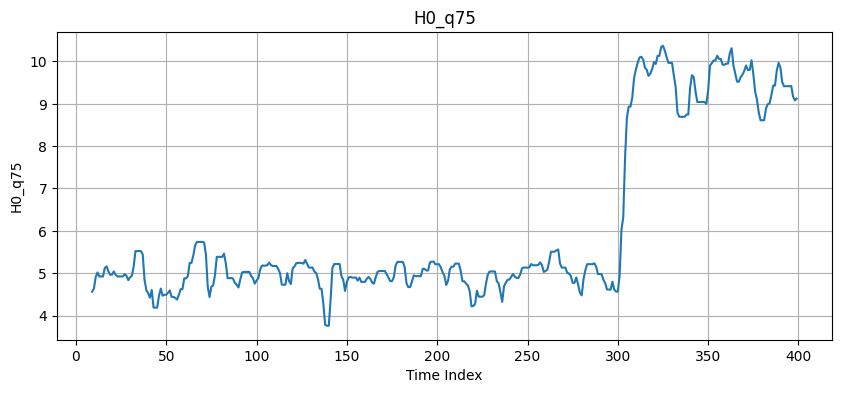

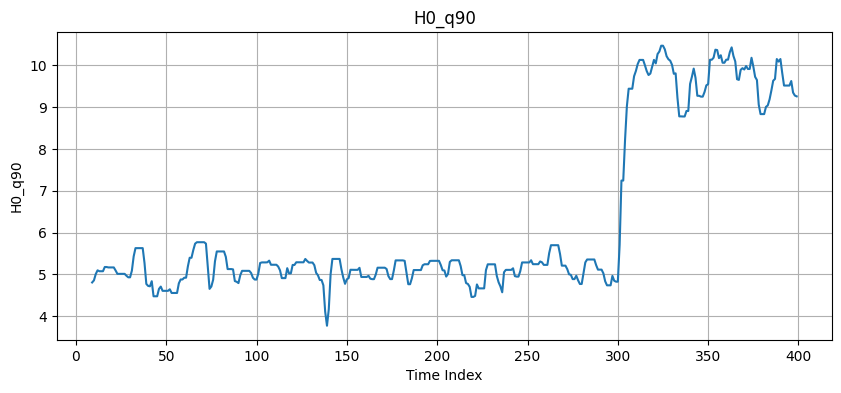

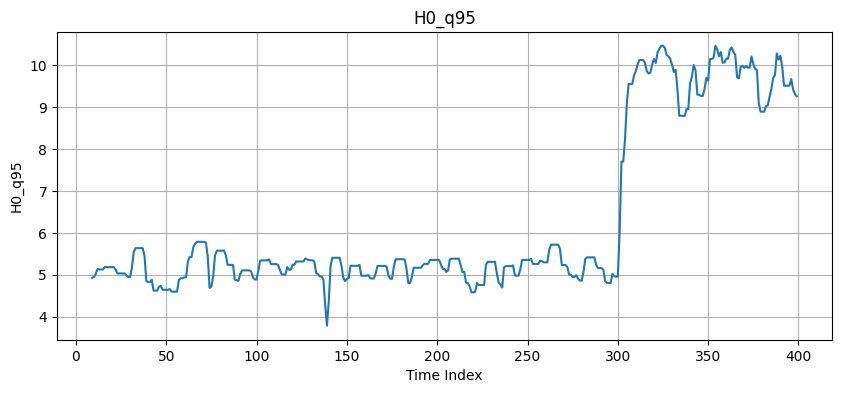

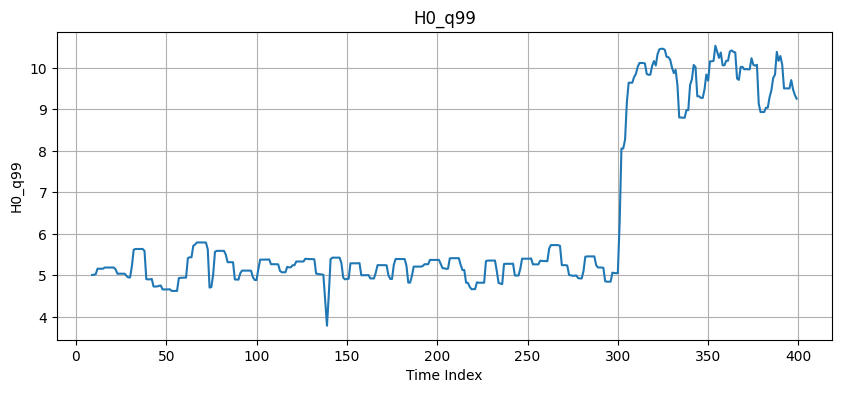

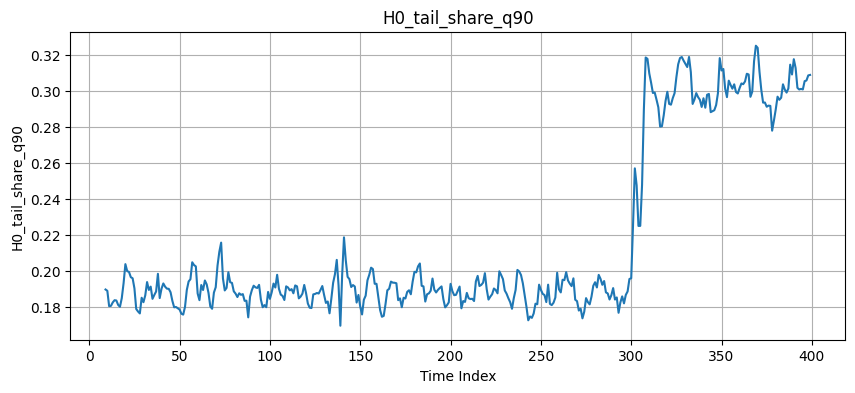

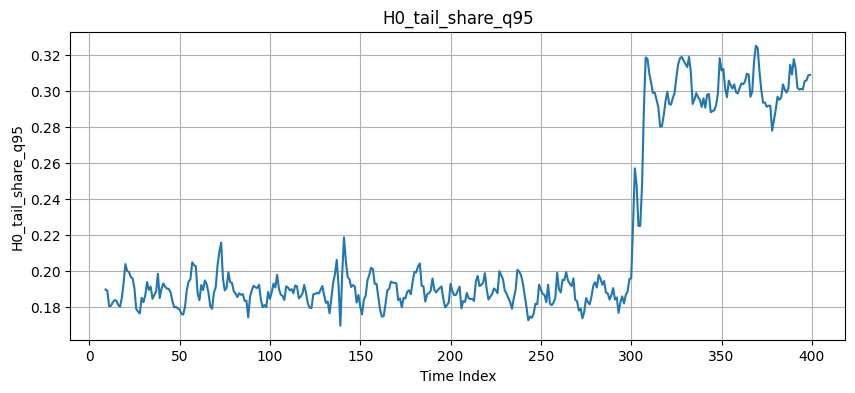

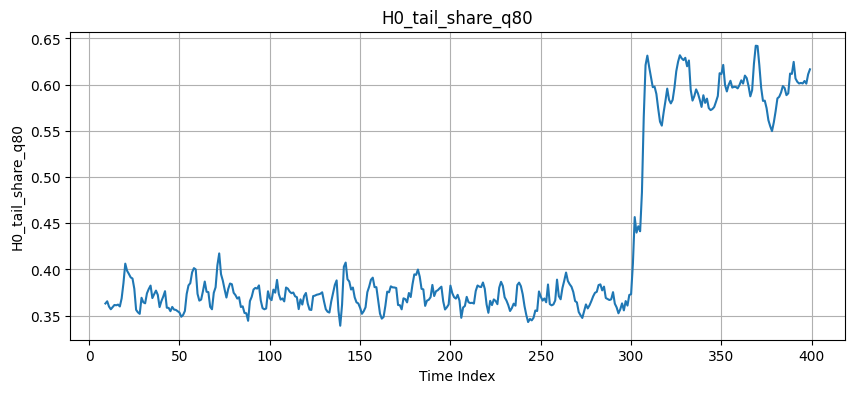

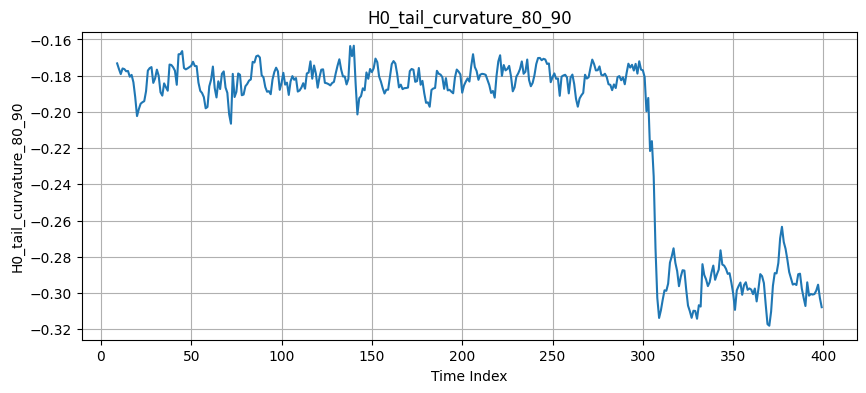

Skipping constant / empty column: H0_tail_curvature_90_99


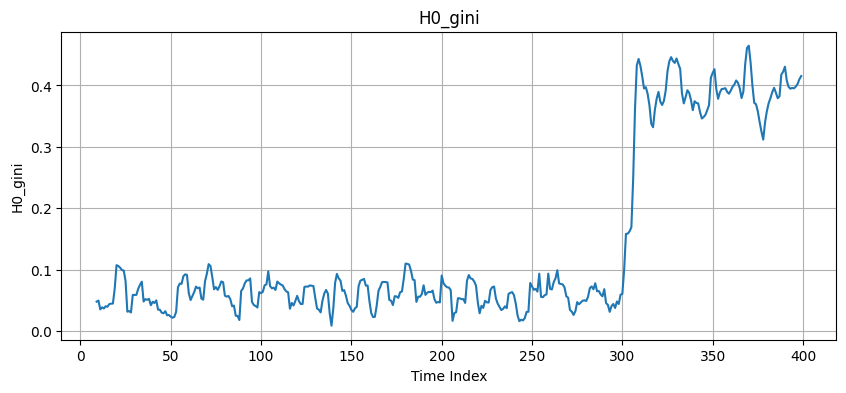

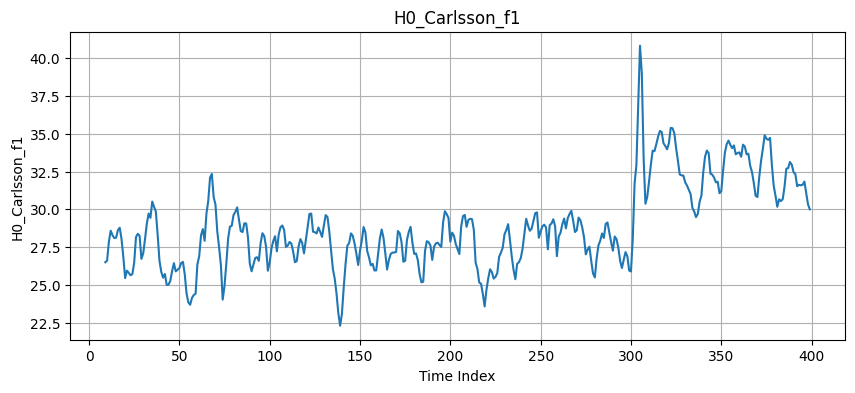

Skipping constant / empty column: H0_Carlsson_f2


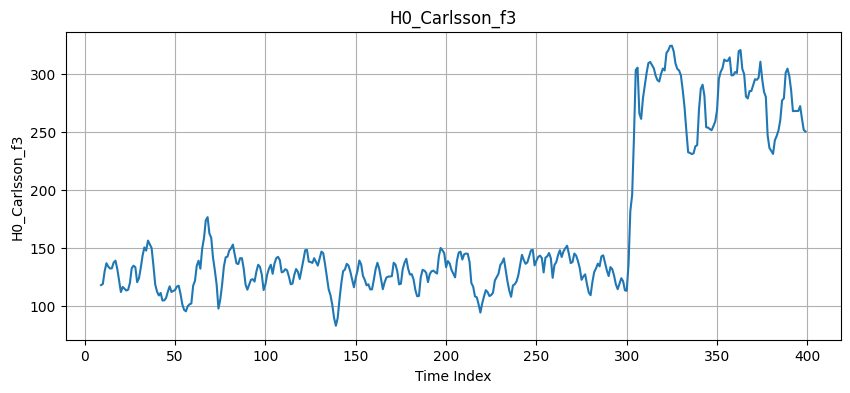

Skipping constant / empty column: H0_Carlsson_f4


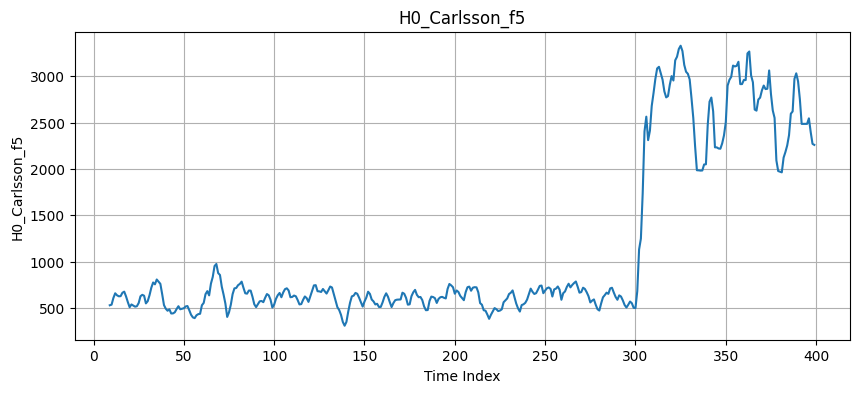

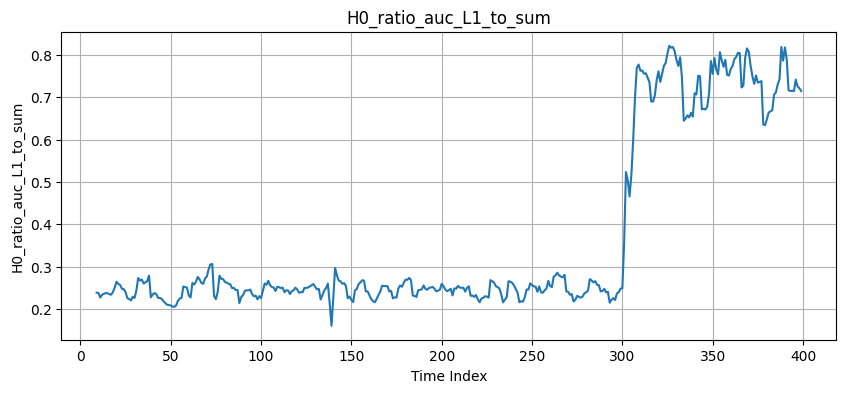

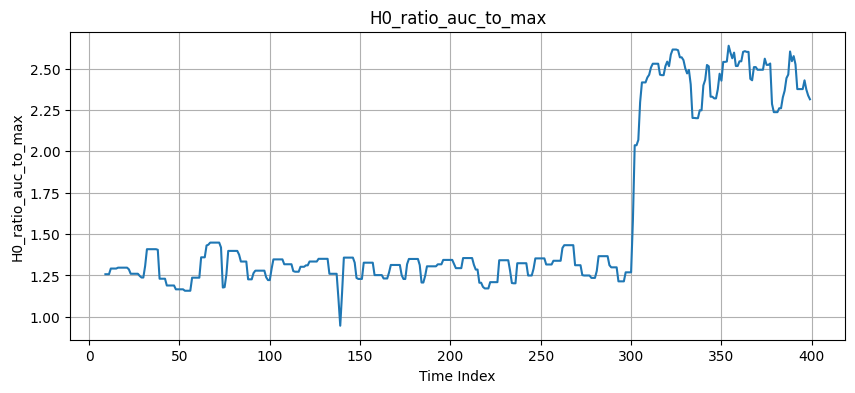

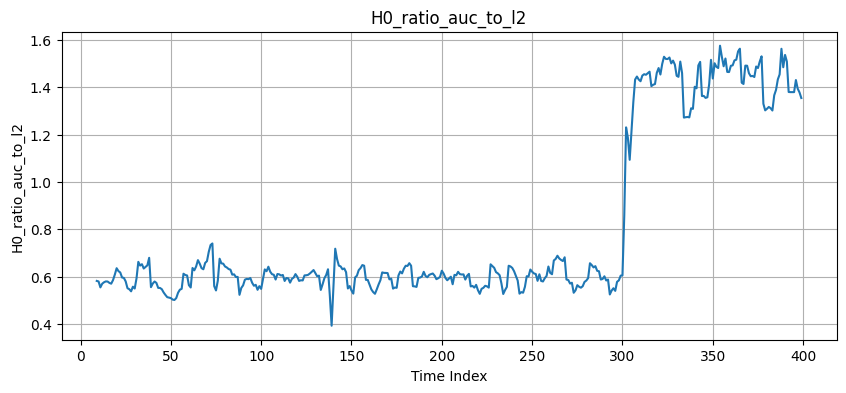

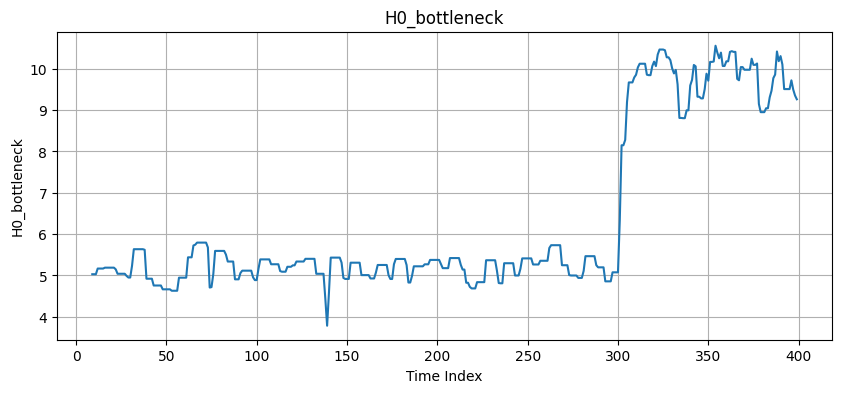

...

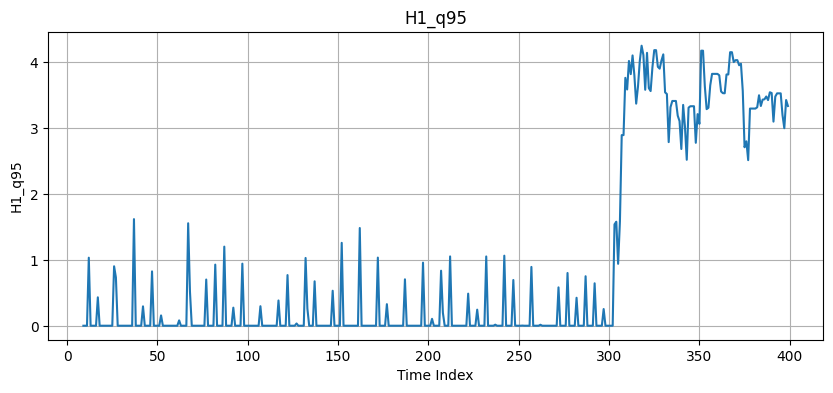

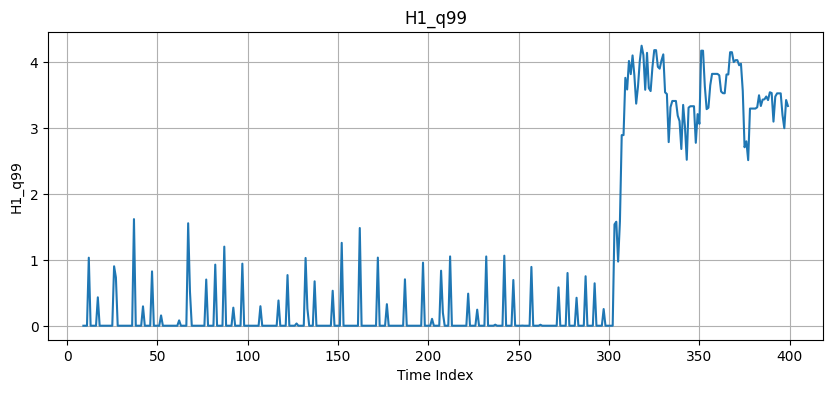

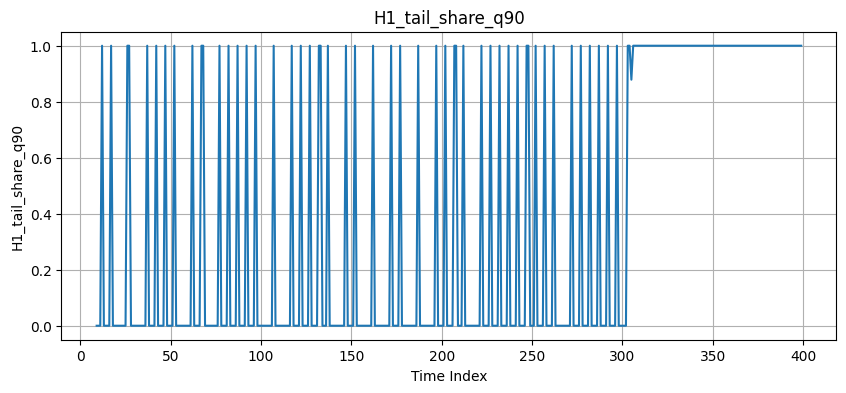

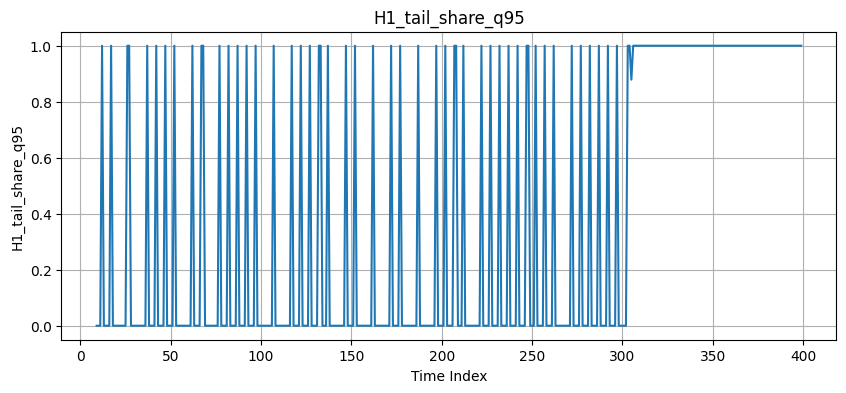

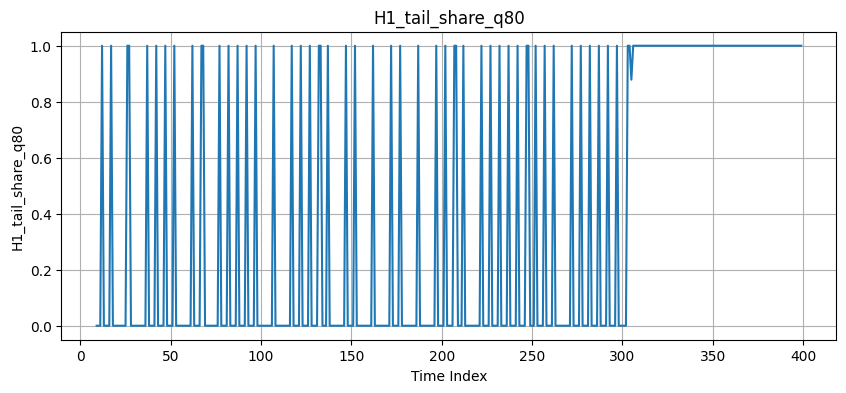

Skipping constant / empty column: H1_tail_curvature_80_90
Skipping constant / empty column: H1_tail_curvature_90_99


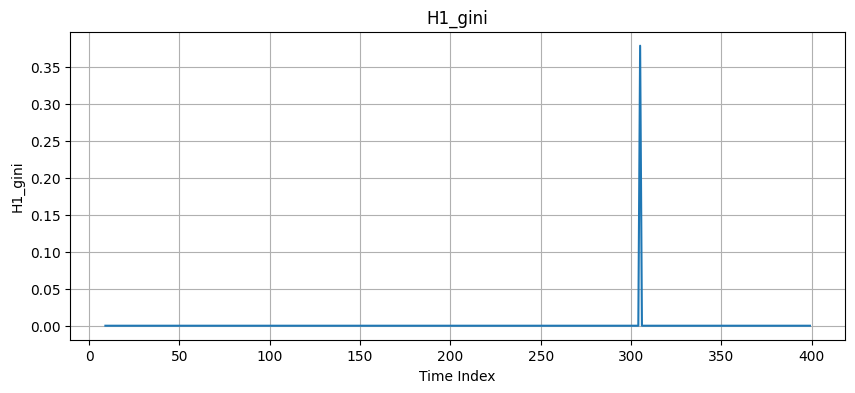

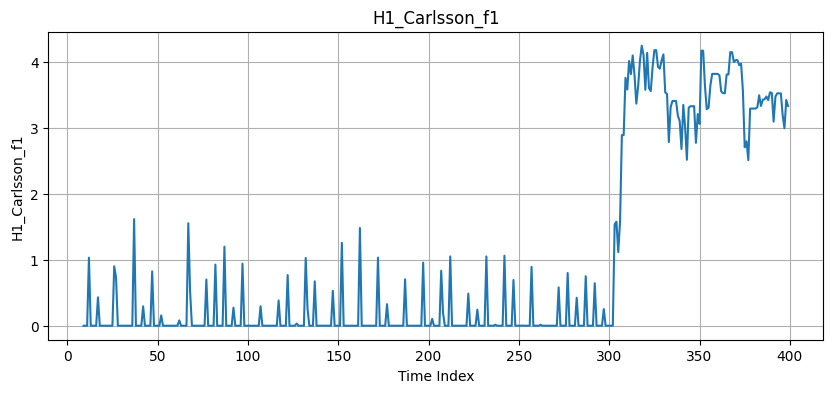

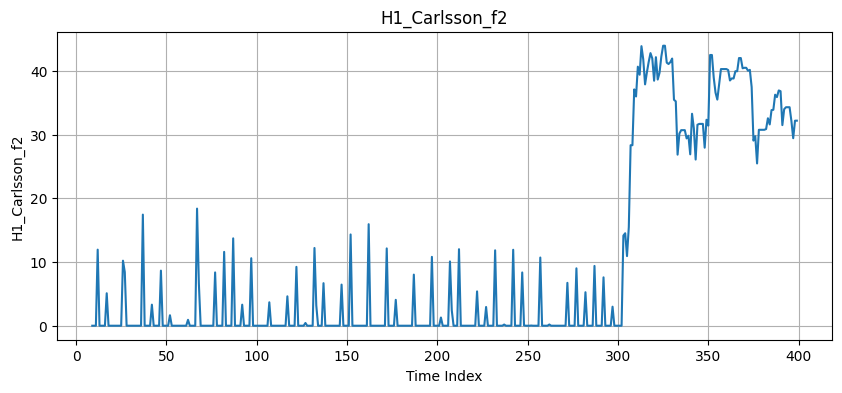

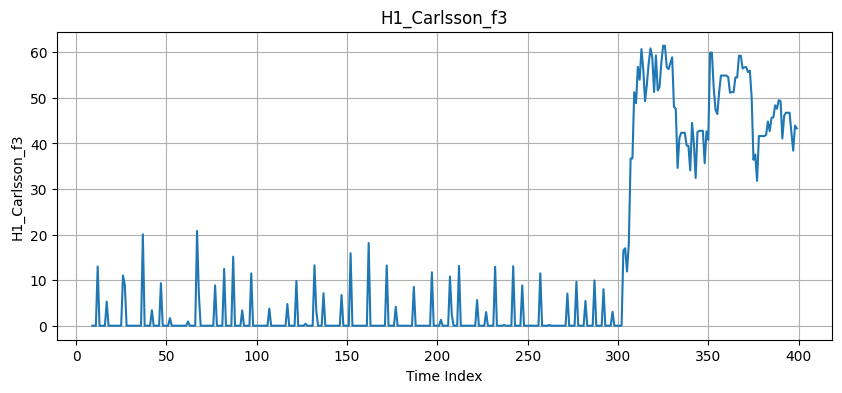

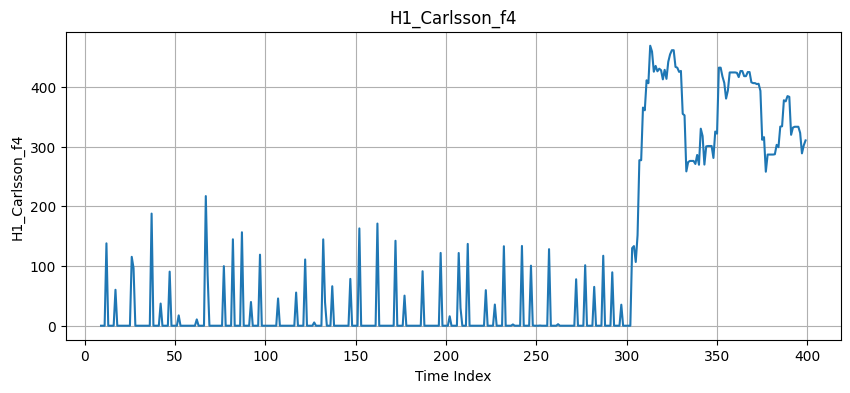

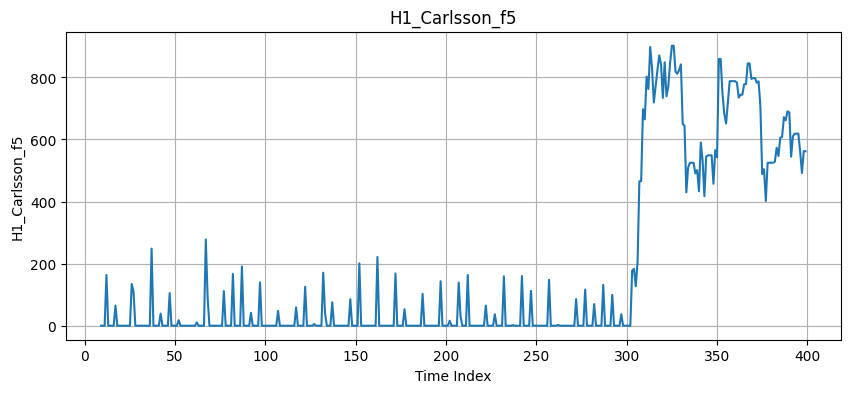

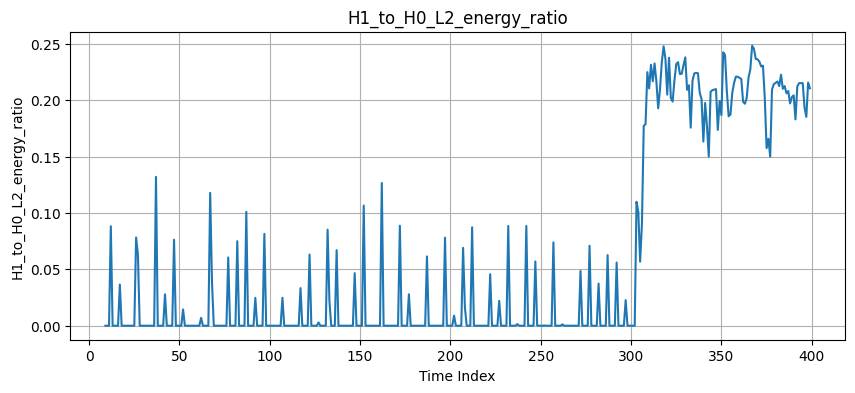

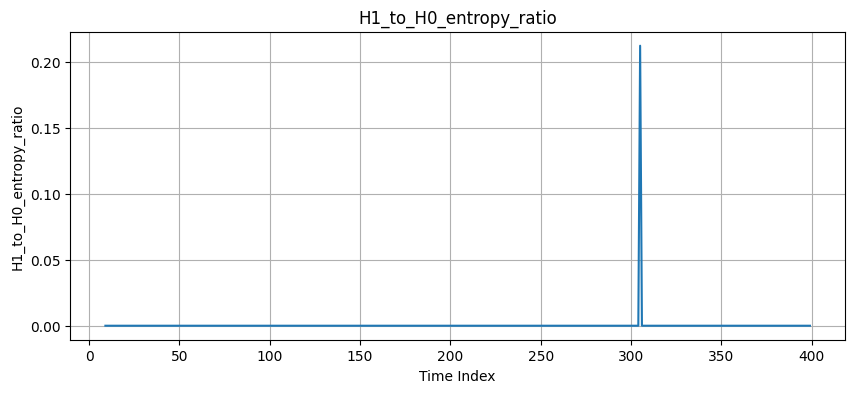

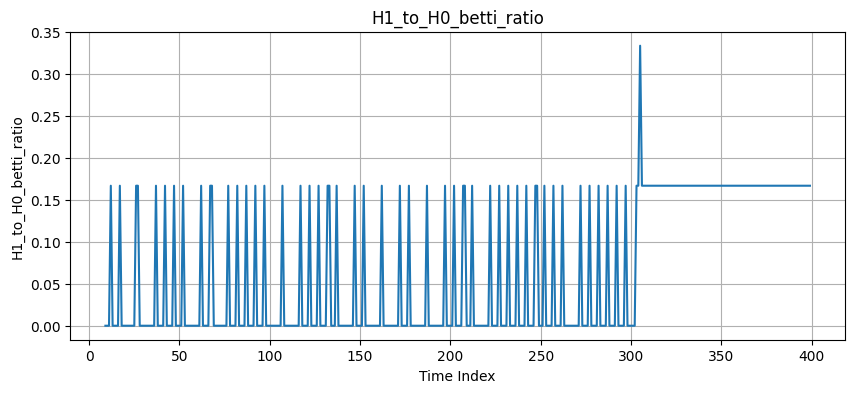

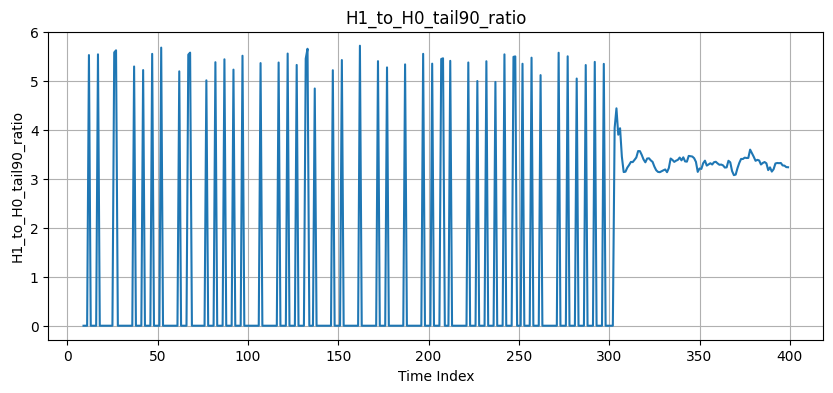

In [122]:
import numpy as np
import matplotlib.pyplot as plt

# Ensure DataFrame exists
df_plot = tda_features_df.copy()

# Loop through all columns
for col in df_plot.columns:

    # Skip non-numeric columns
    if not np.issubdtype(df_plot[col].dtype, np.number):
        print(f"Skipping non-numeric column: {col}")
        continue

    y = df_plot[col].values

    # Skip columns that are constant or all NaN
    if np.all(np.isnan(y)) or np.nanstd(y) == 0:
        print(f"Skipping constant / empty column: {col}")
        continue

    plt.figure(figsize=(10, 4))
    plt.plot(y)
    plt.title(col)
    plt.xlabel("Time Index")
    plt.ylabel(col)
    plt.grid(True)
    plt.show()


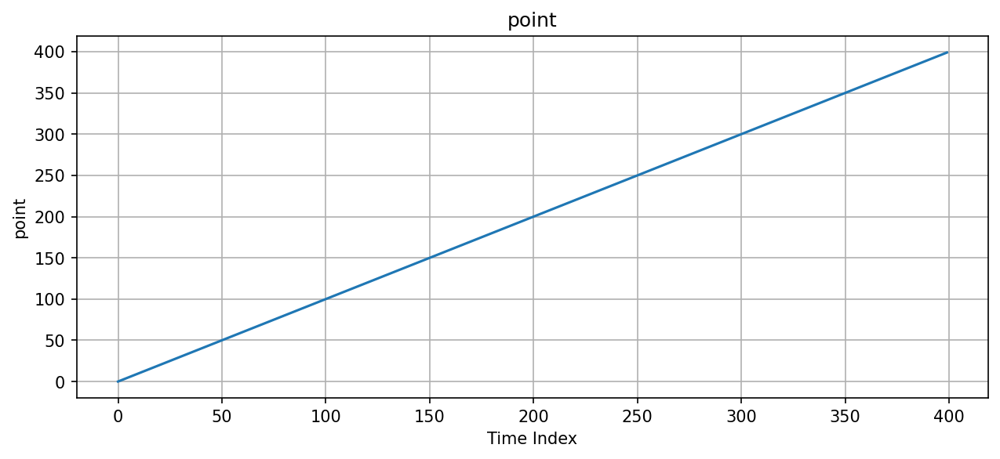

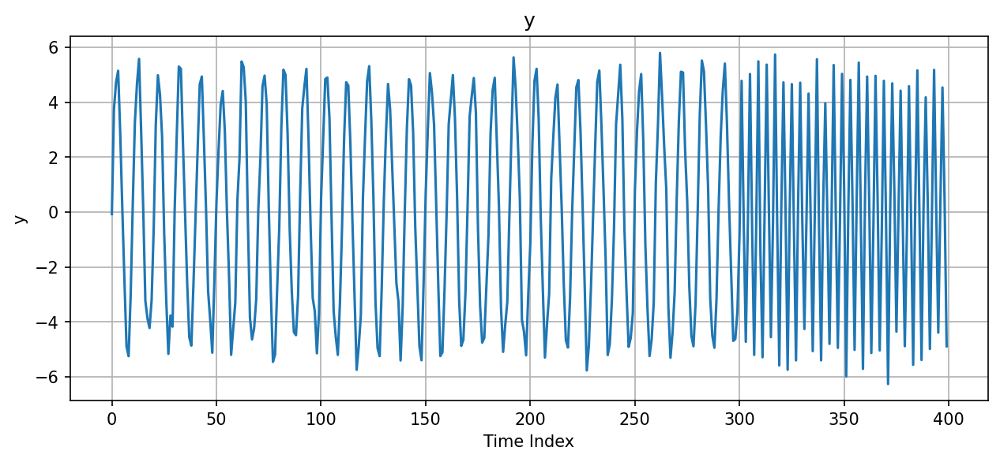

Skipping constant / empty column: H0_count_lifetime


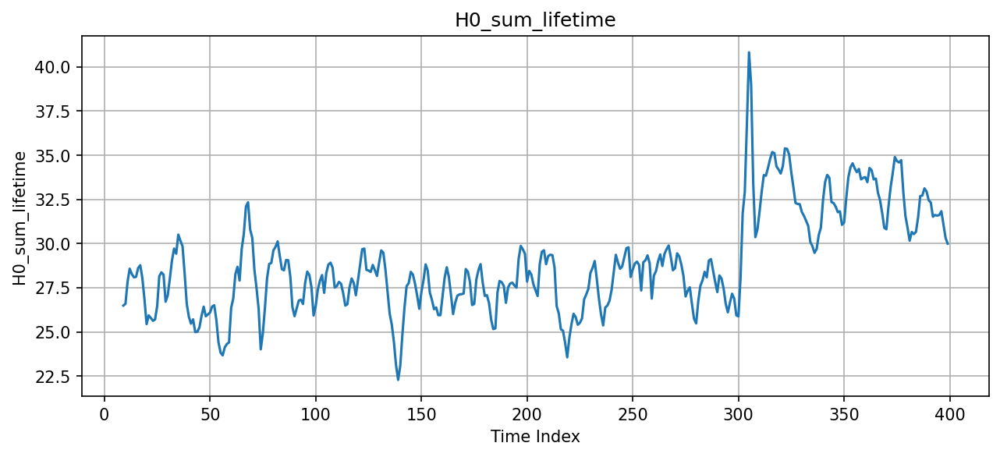

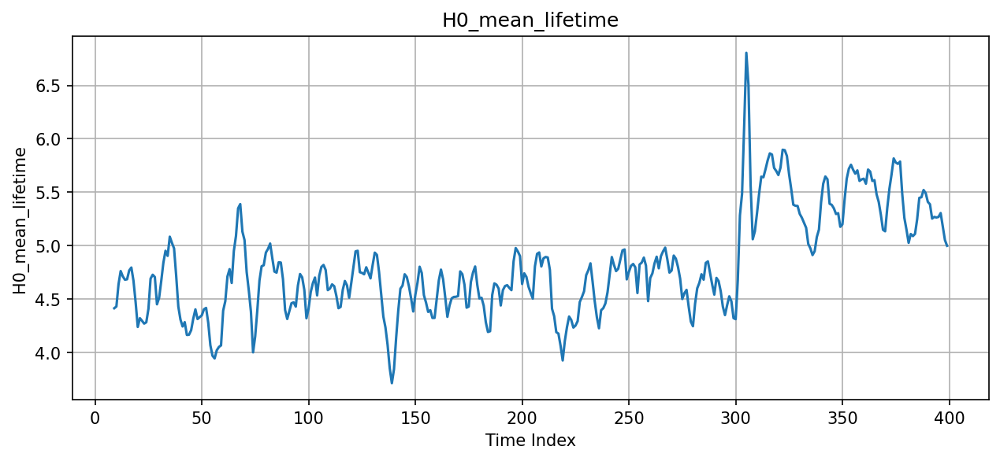

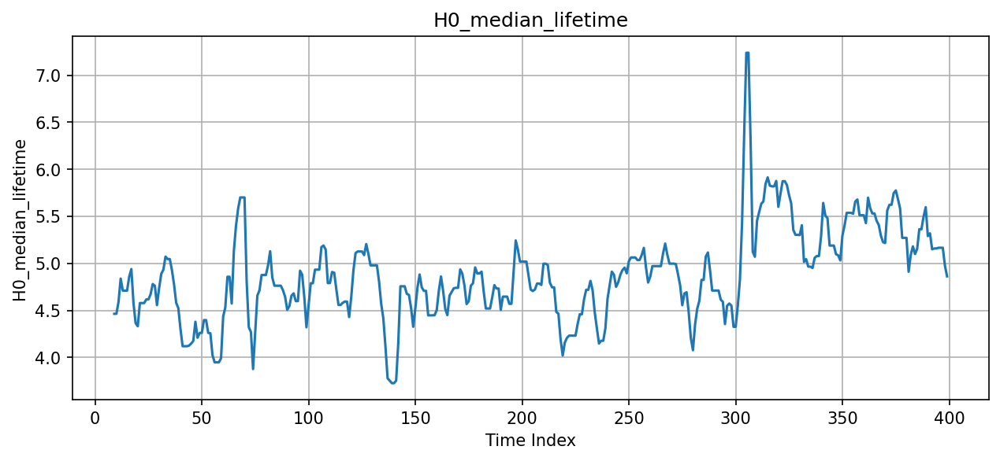

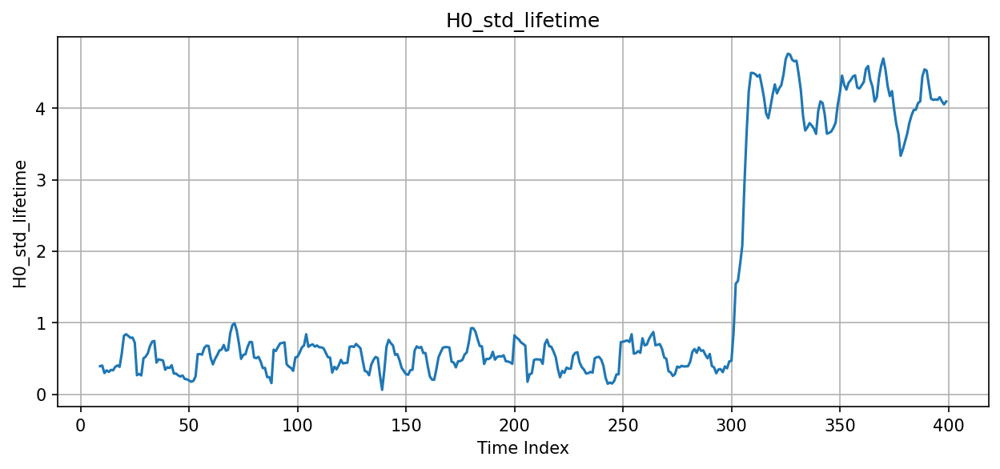

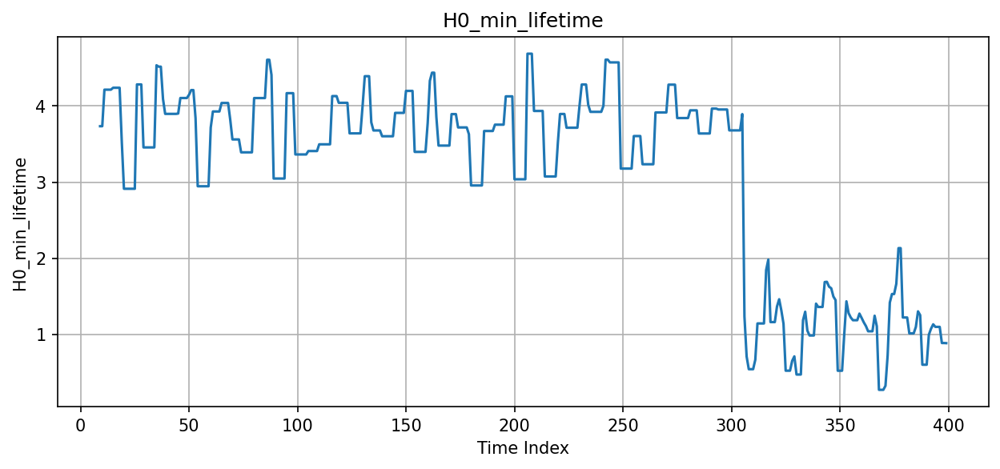

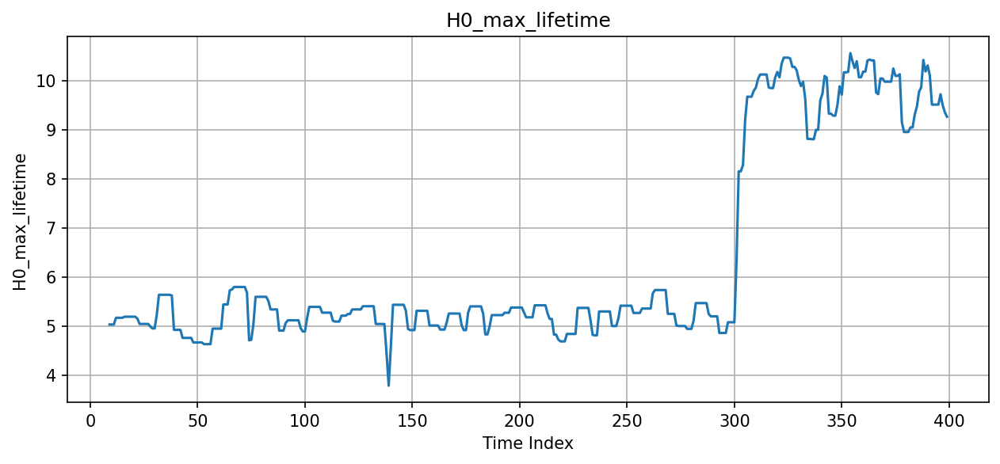

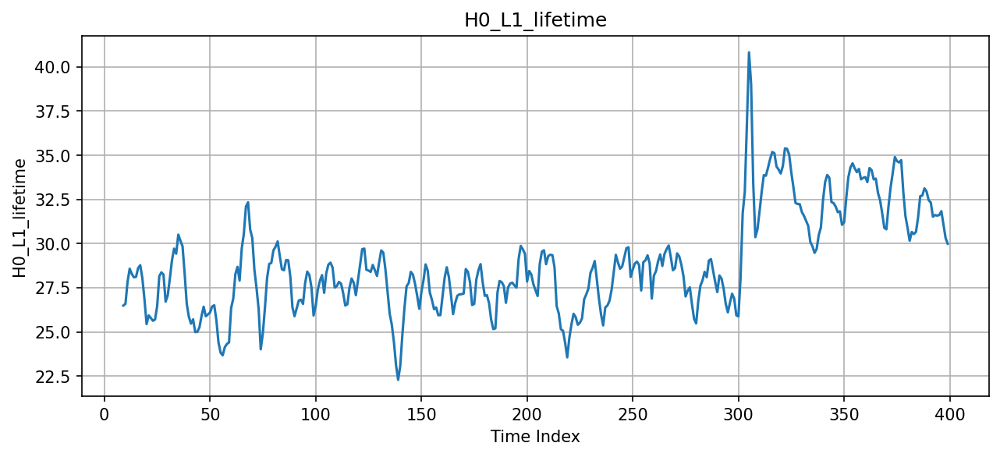

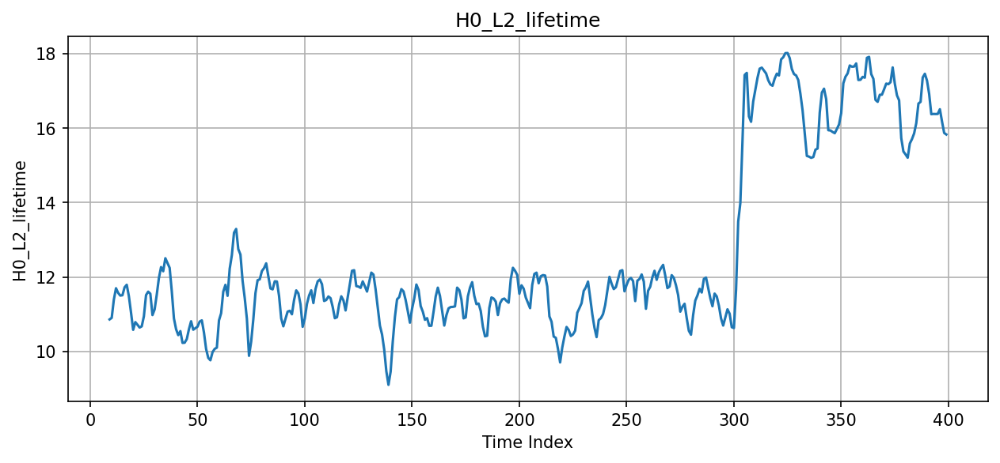

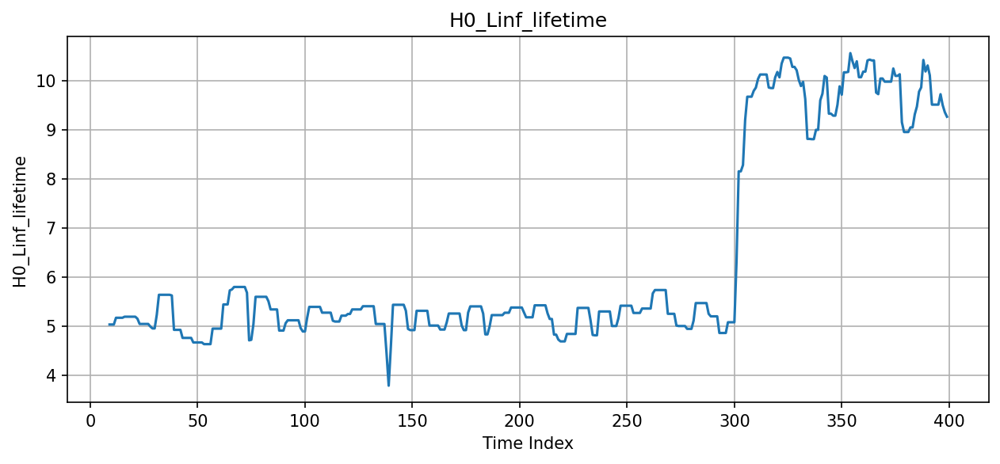

Skipping constant / empty column: H0_betti


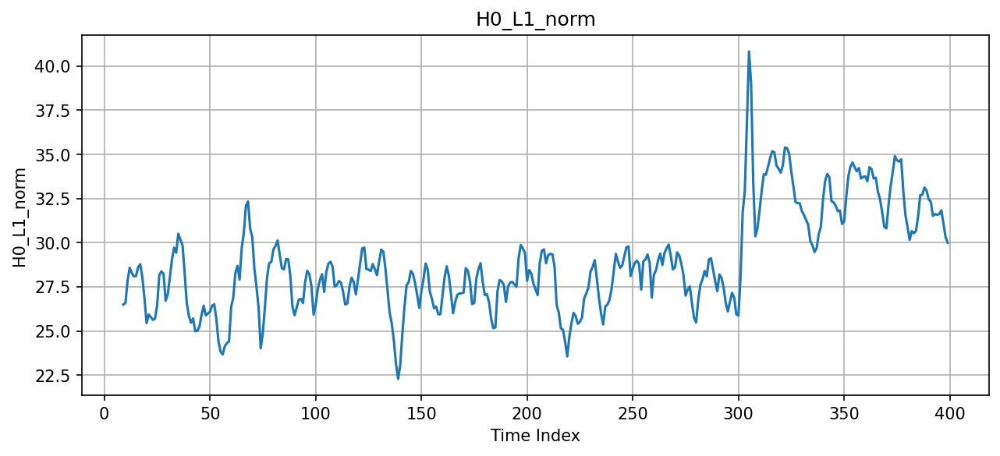

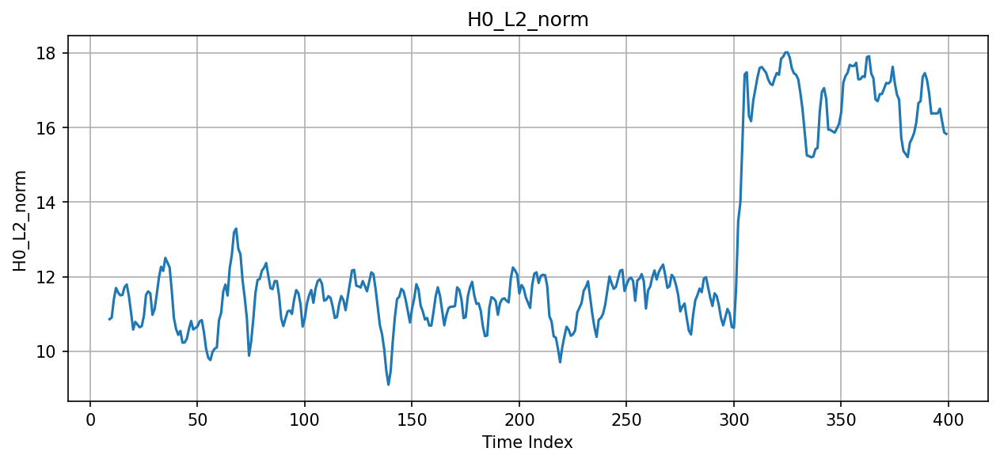

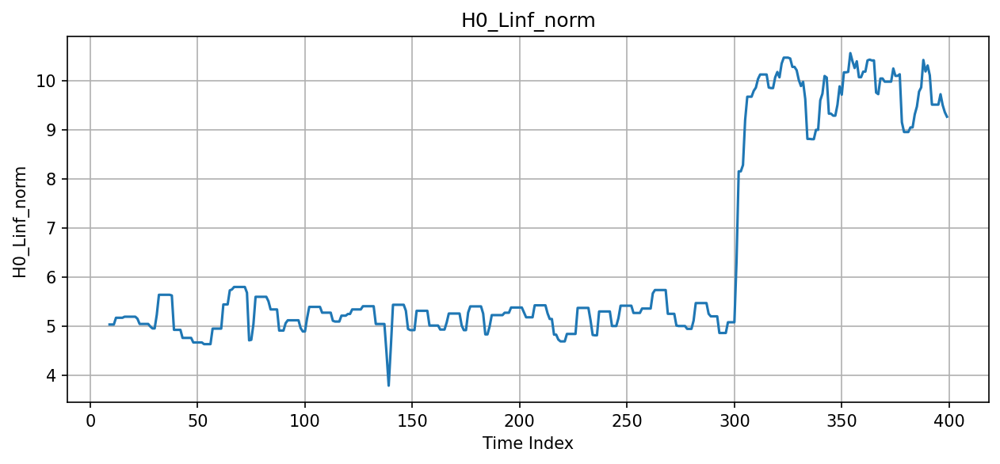

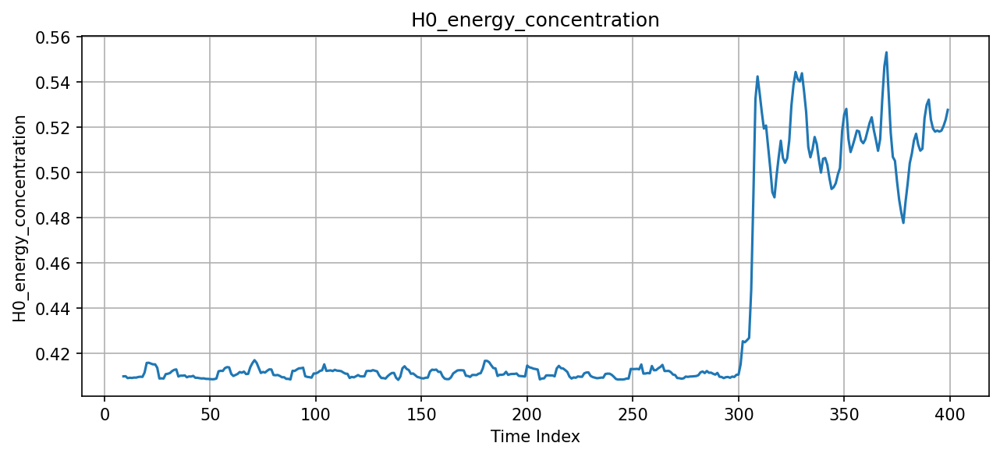

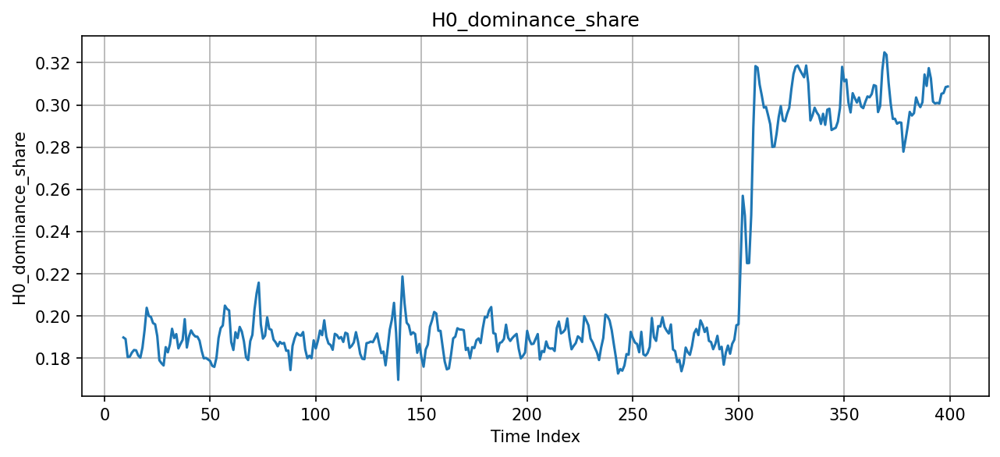

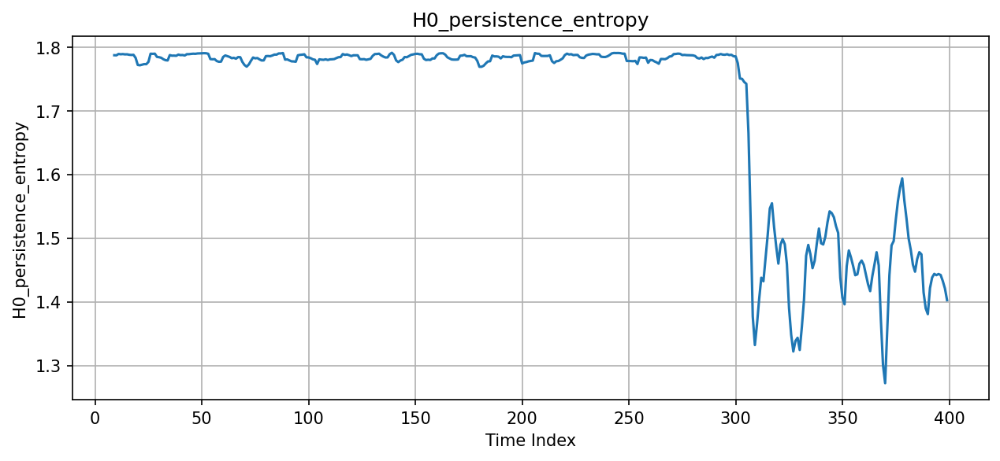

Skipping constant / empty column: H0_mean_birth


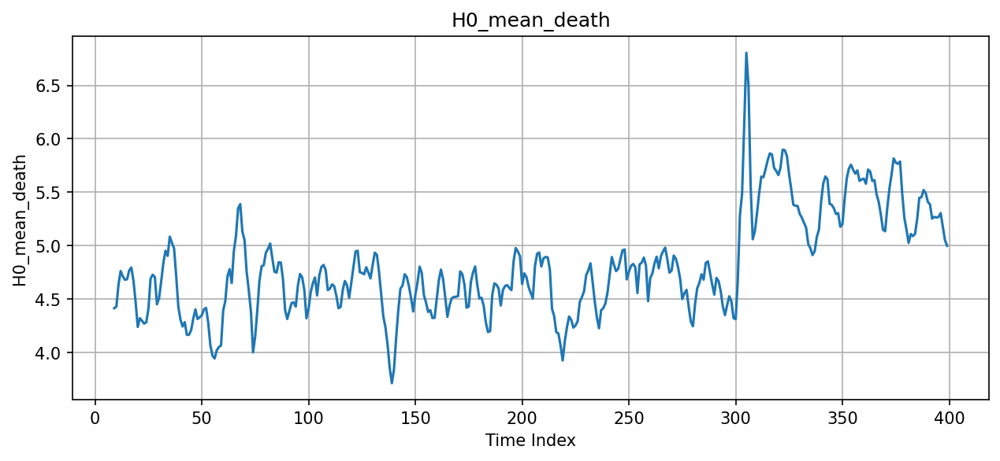

Skipping constant / empty column: H0_std_birth


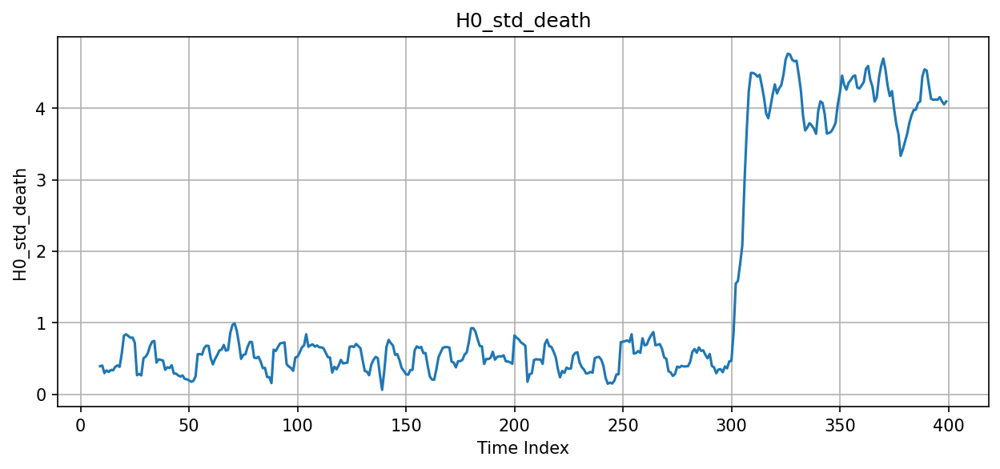

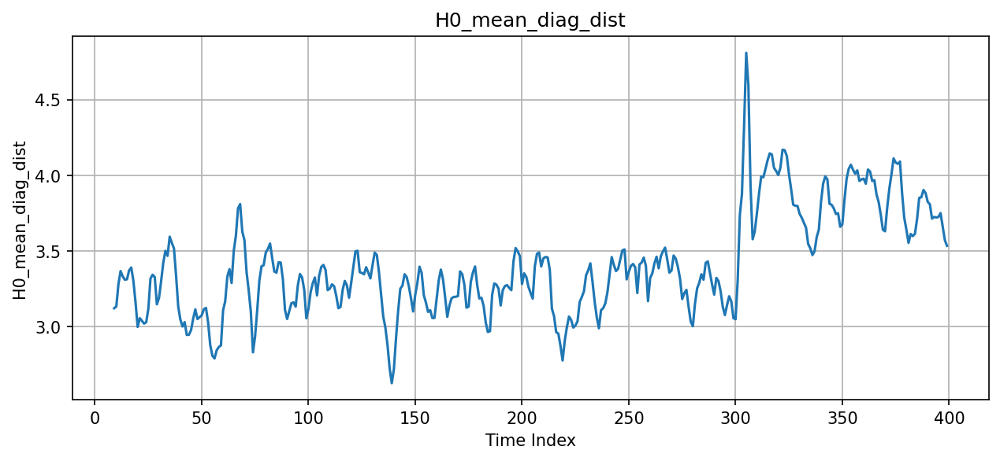

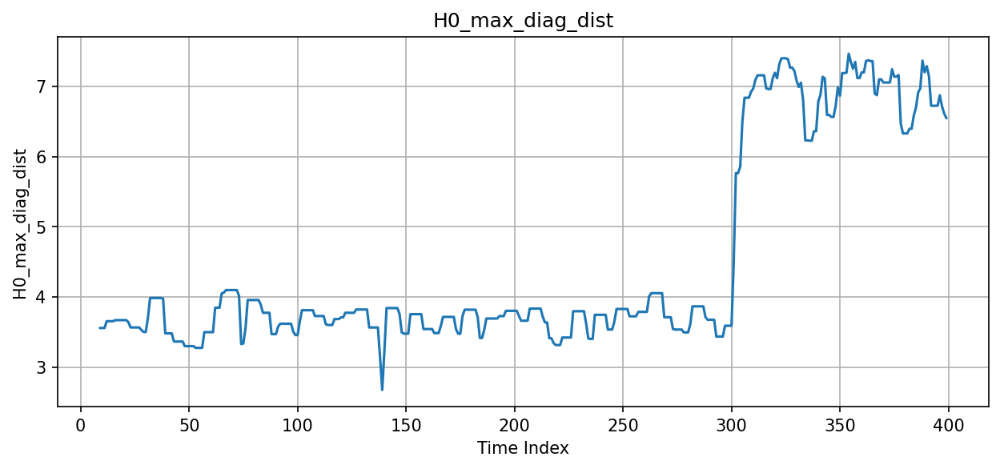

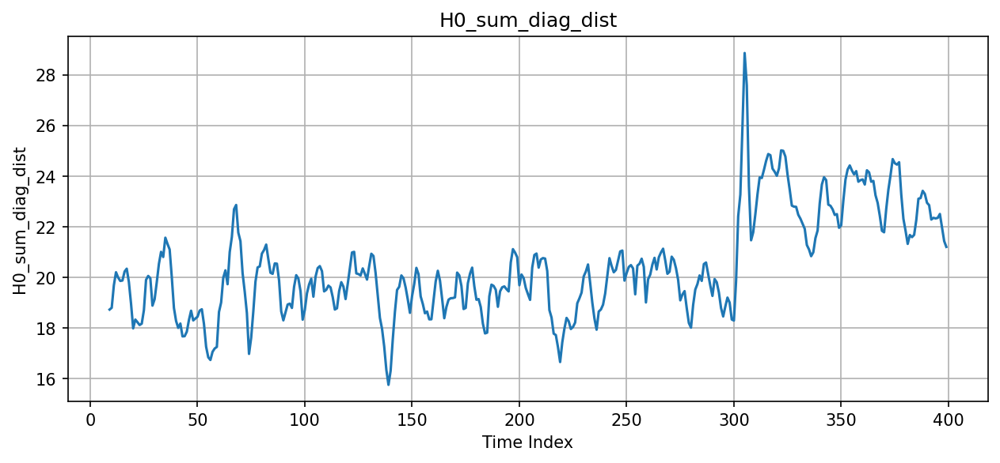

Skipping constant / empty column: H0_centroid_x


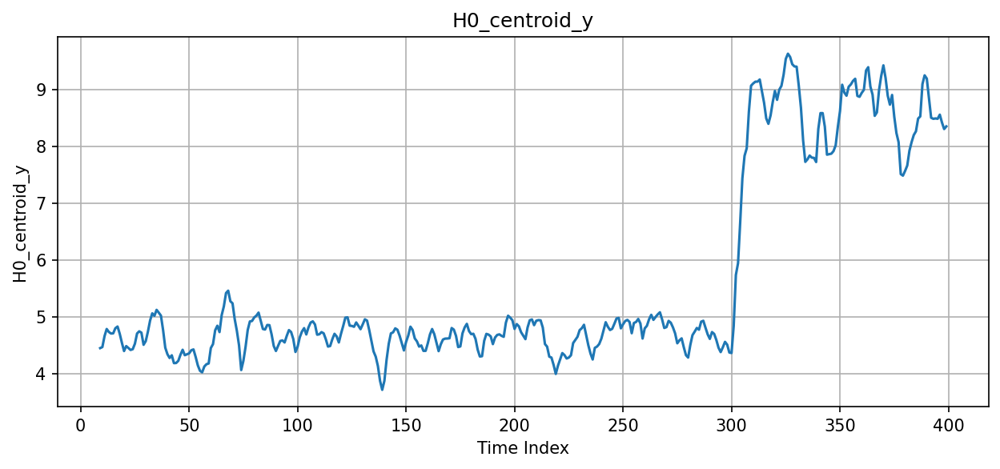

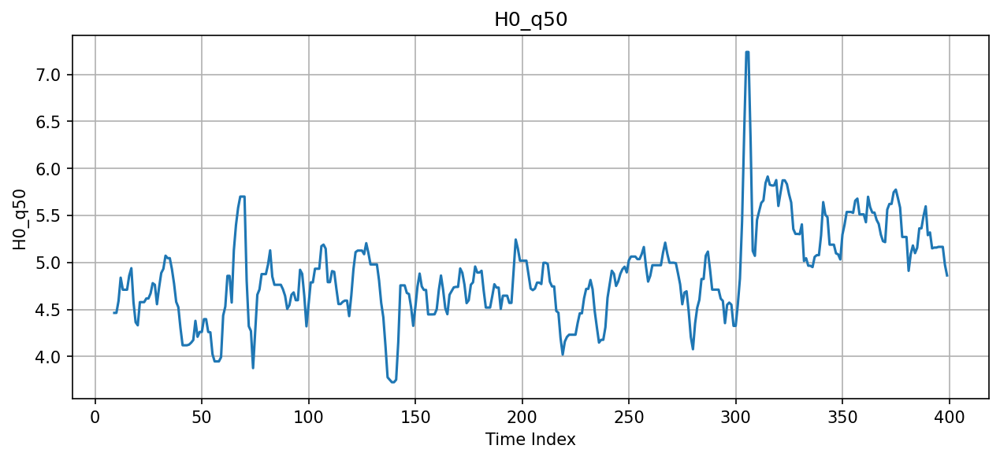

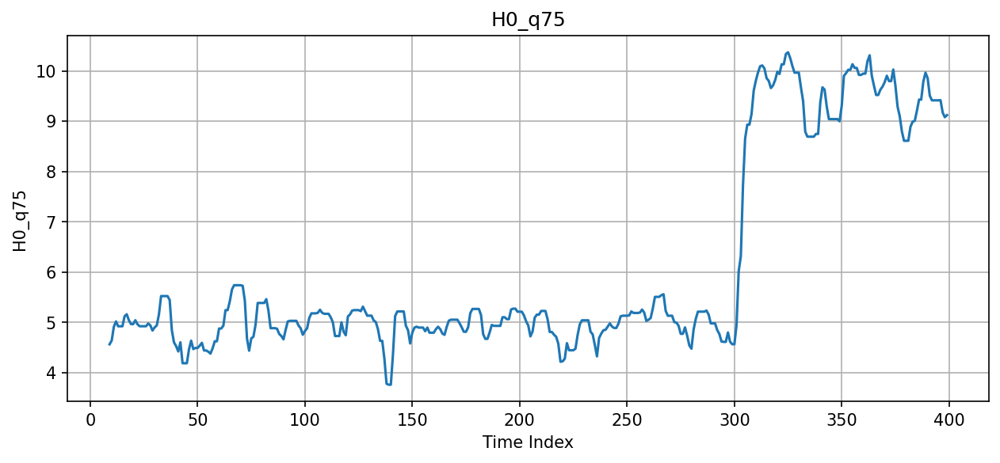

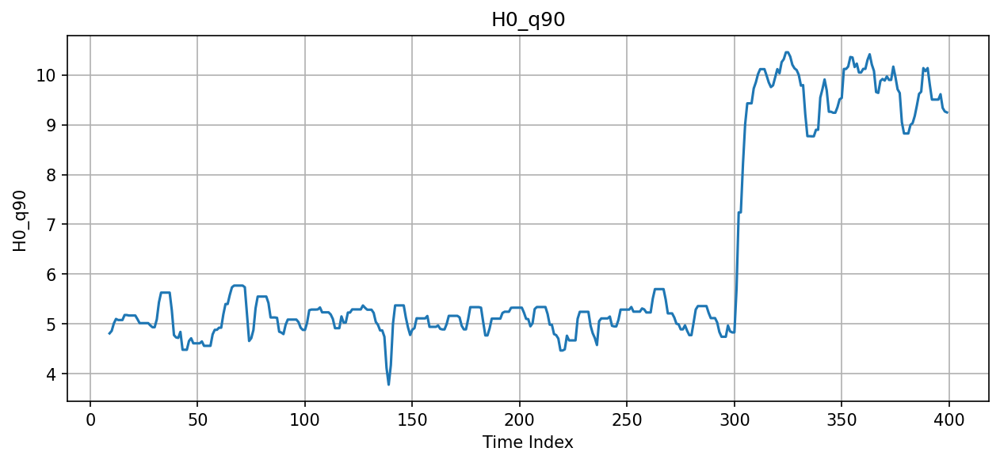

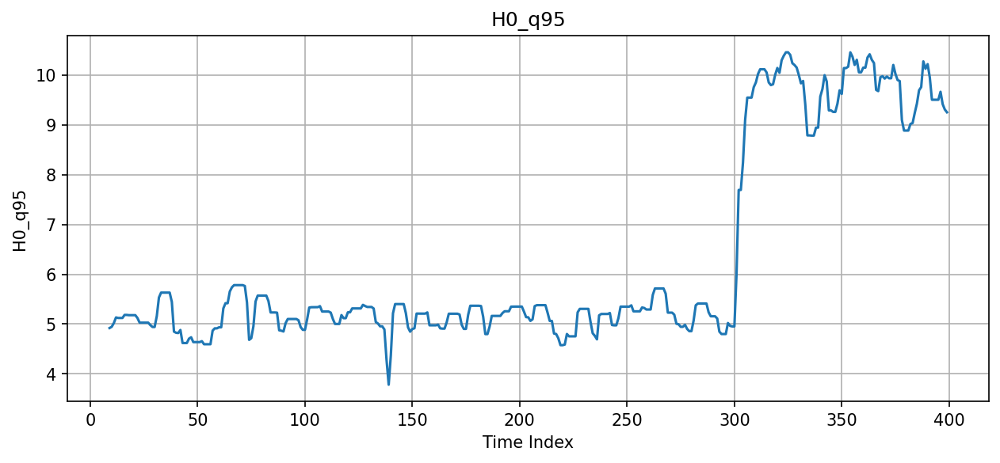

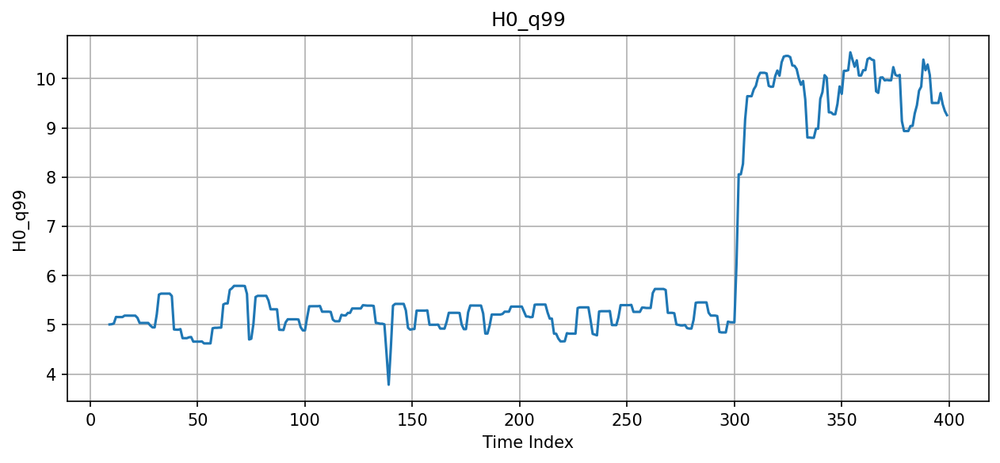

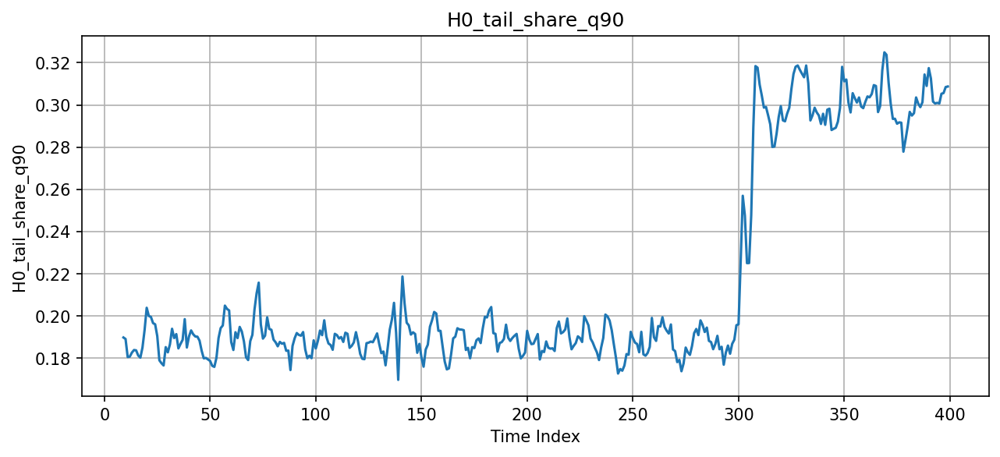

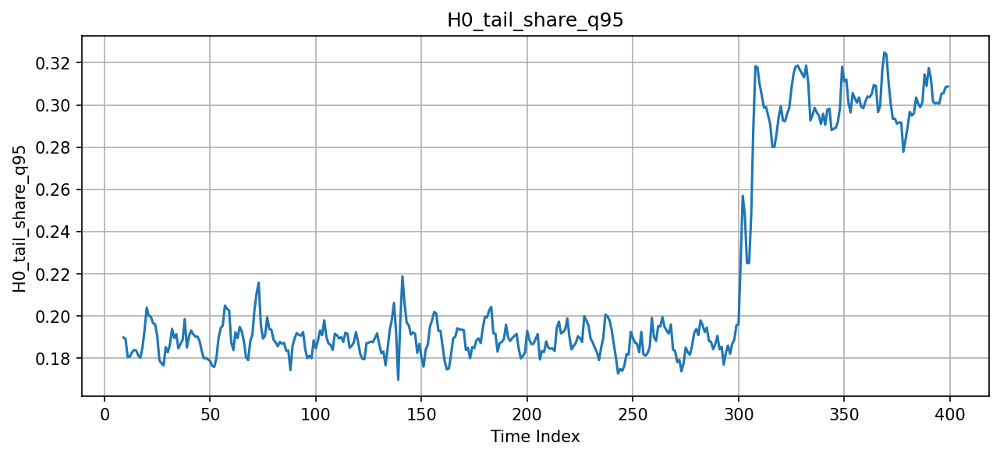

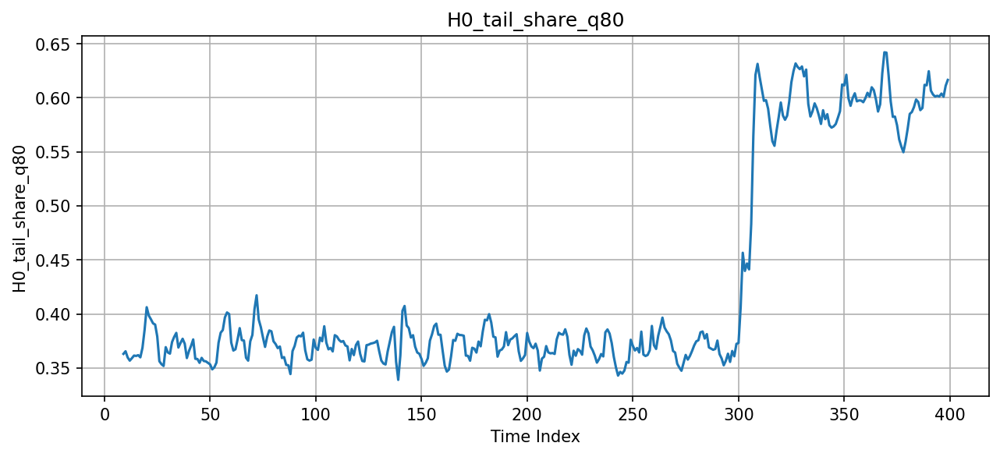

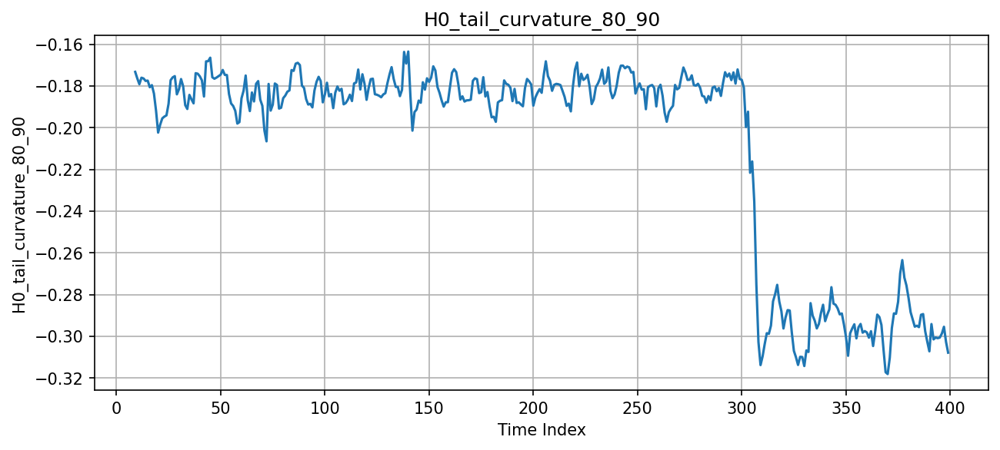

Skipping constant / empty column: H0_tail_curvature_90_99


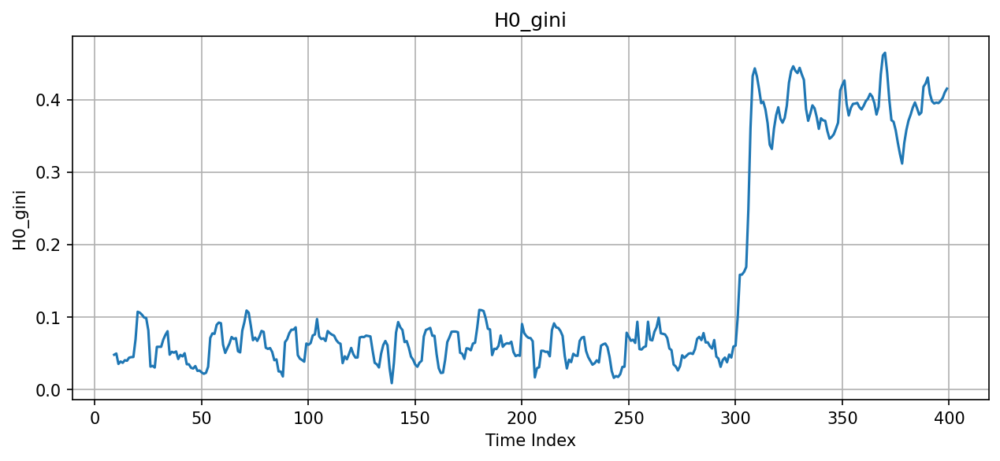

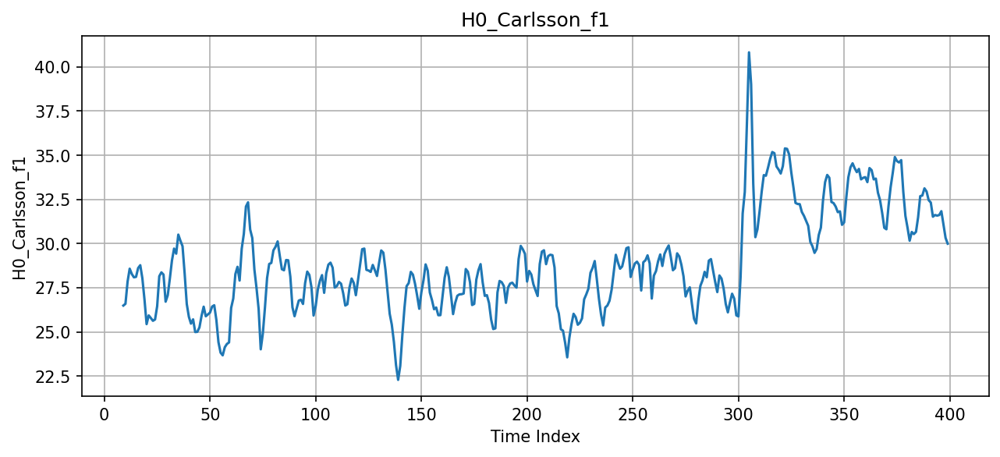

Skipping constant / empty column: H0_Carlsson_f2


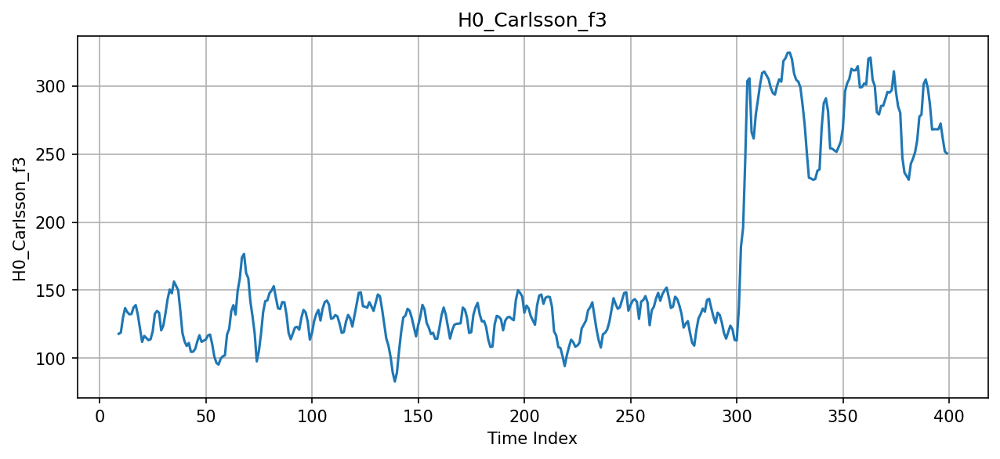

Skipping constant / empty column: H0_Carlsson_f4


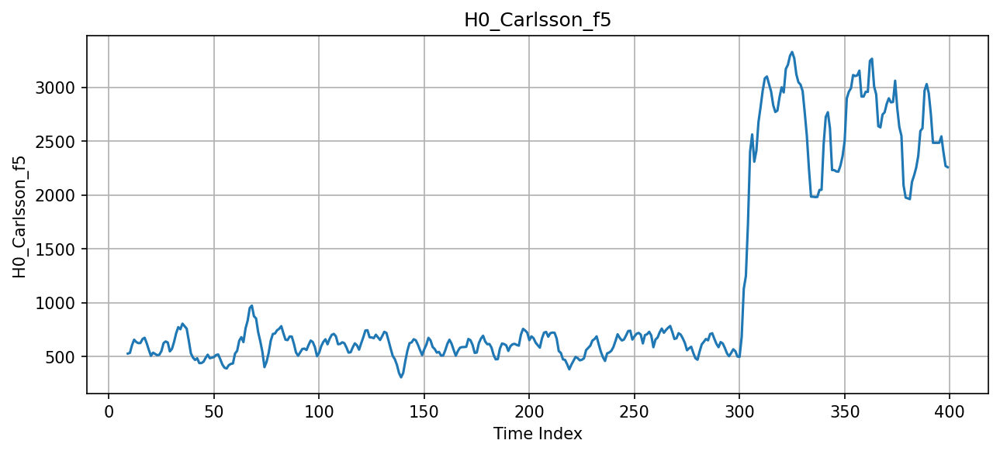

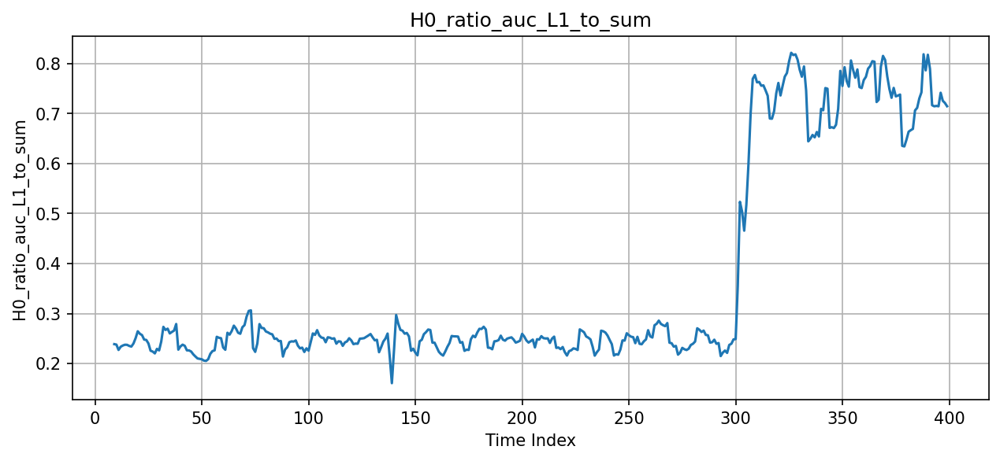

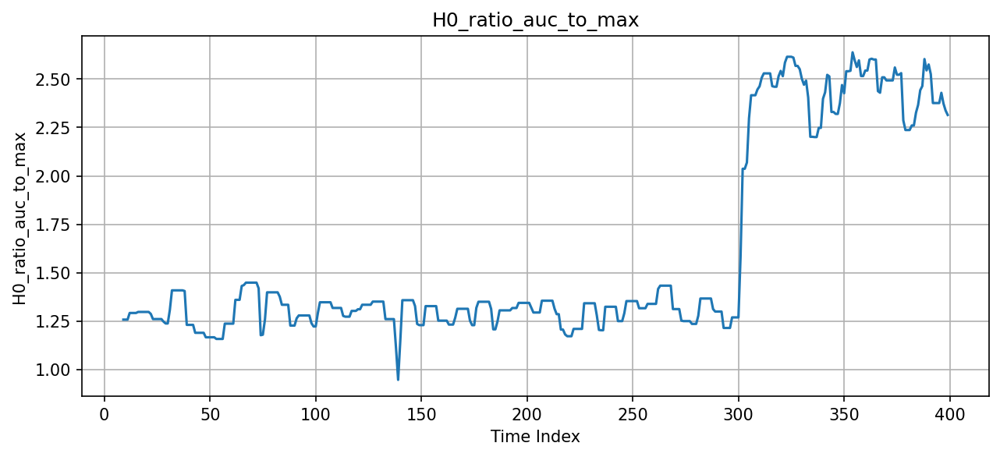

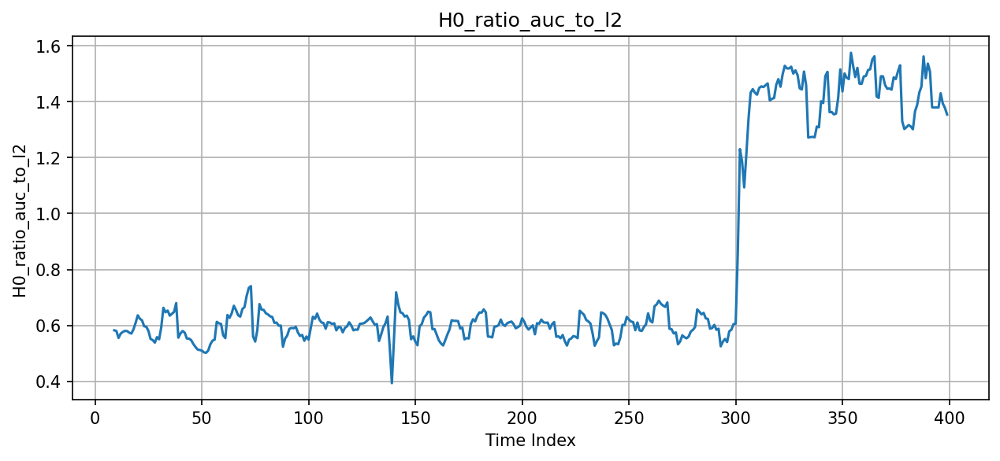

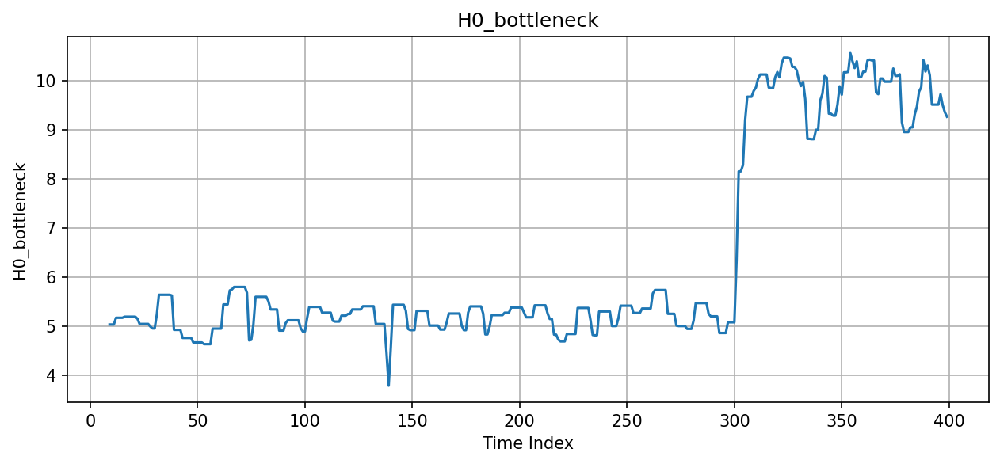

...

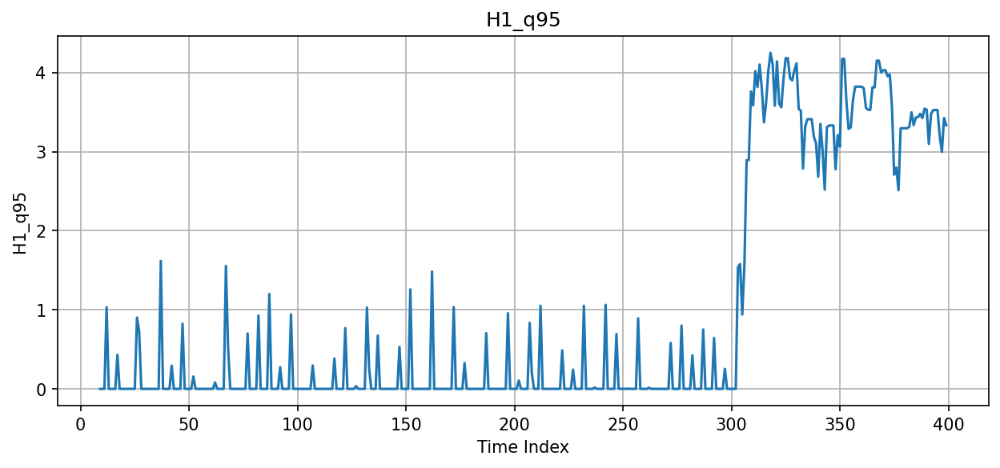

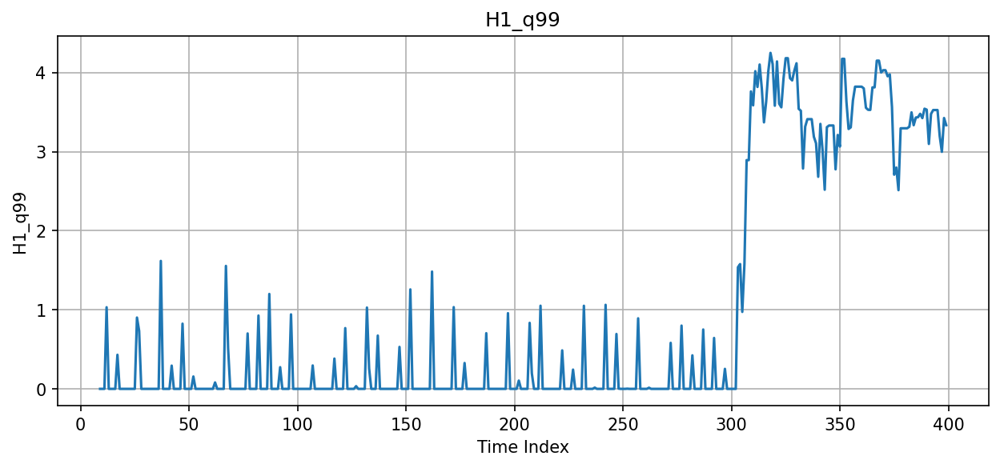

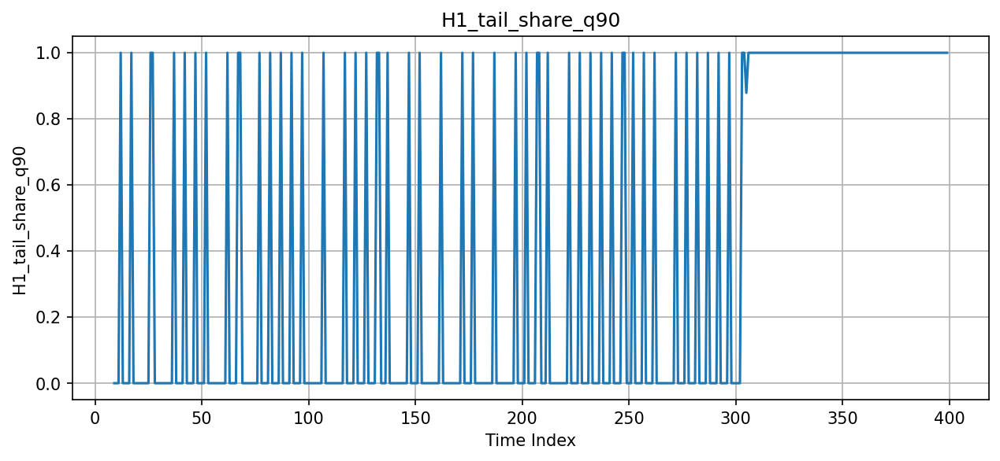

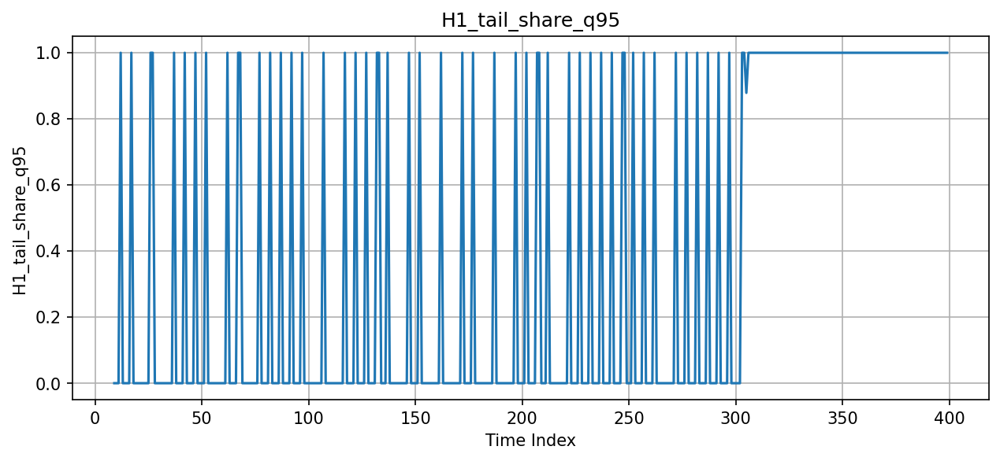

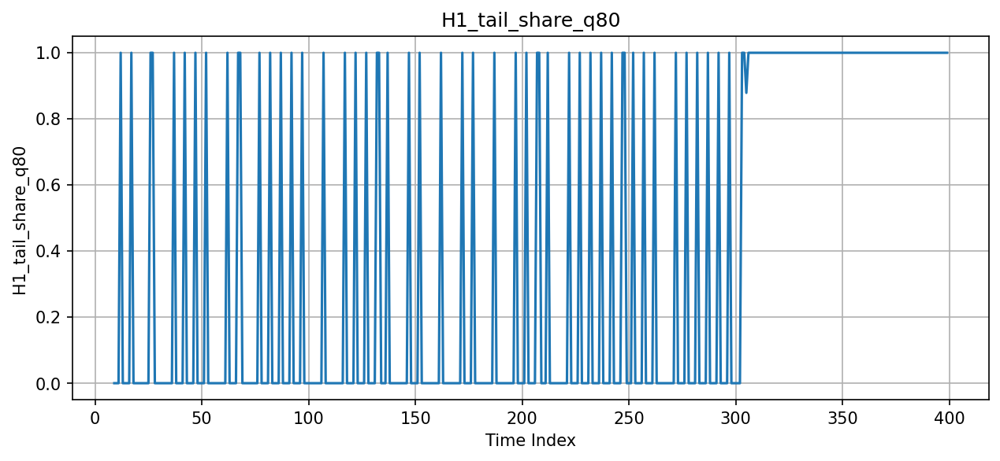

Skipping constant / empty column: H1_tail_curvature_80_90
Skipping constant / empty column: H1_tail_curvature_90_99


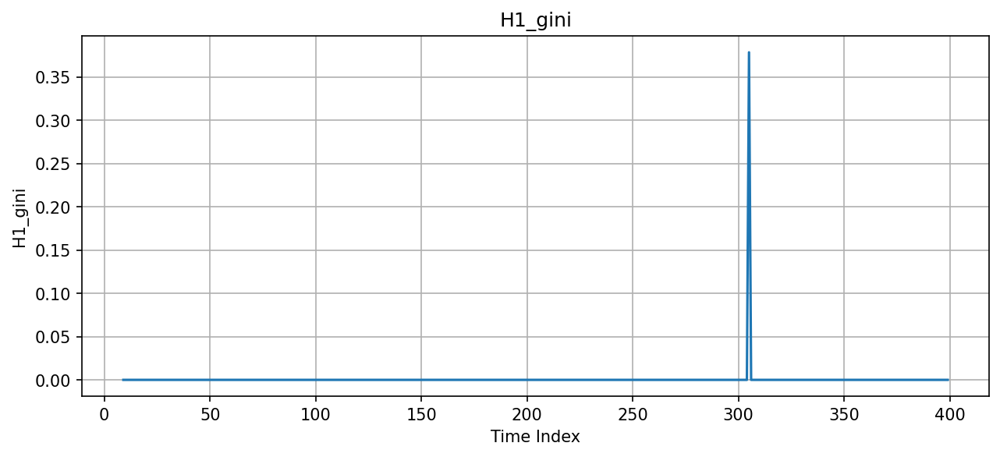

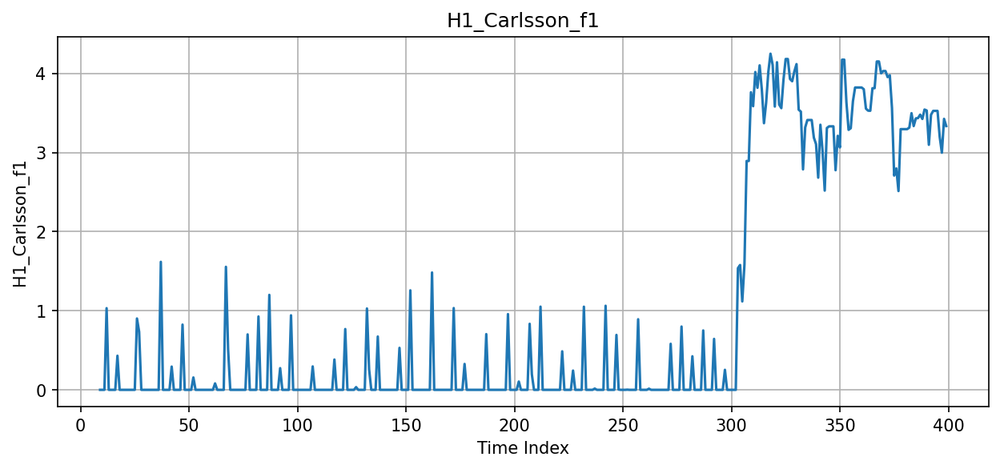

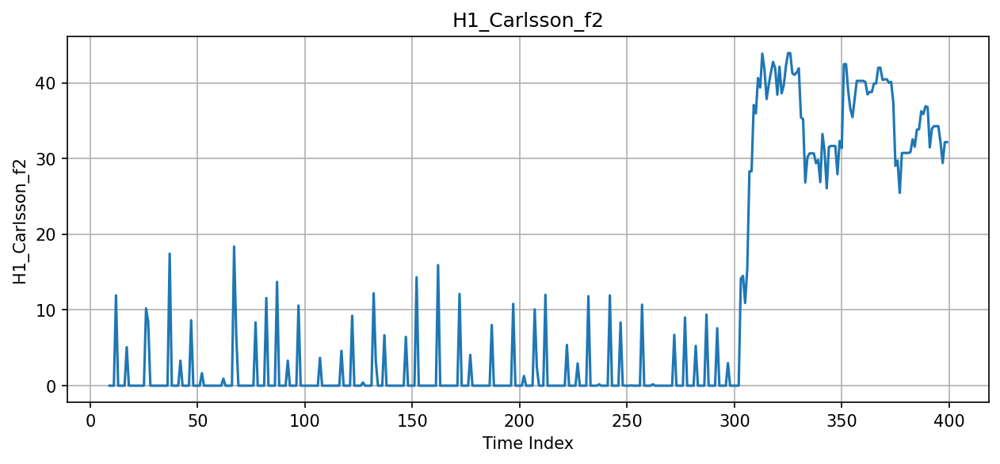

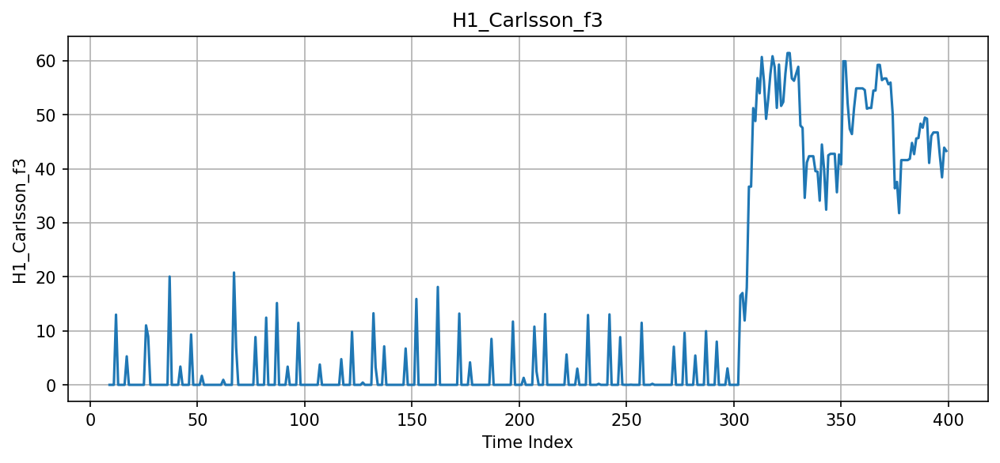

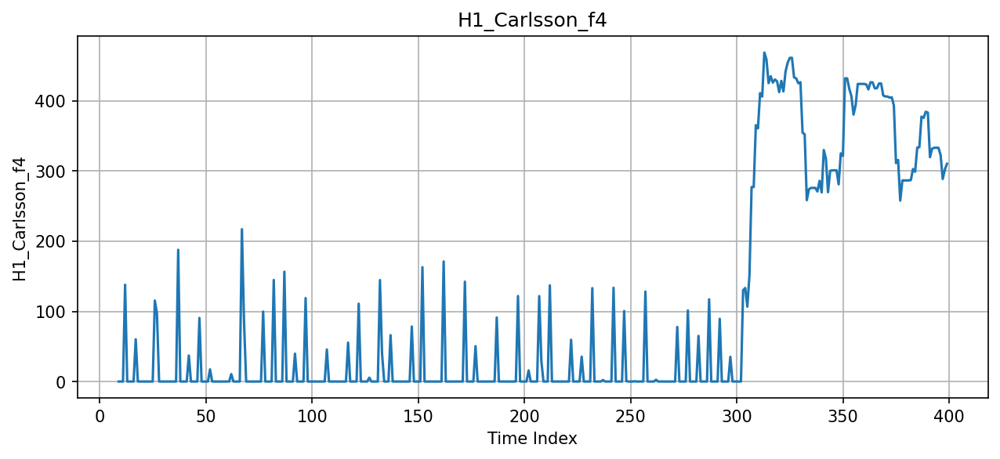

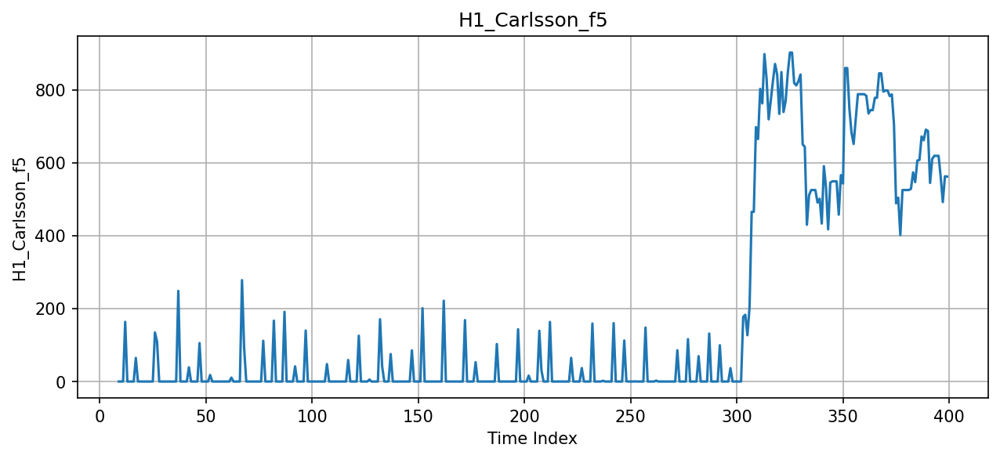

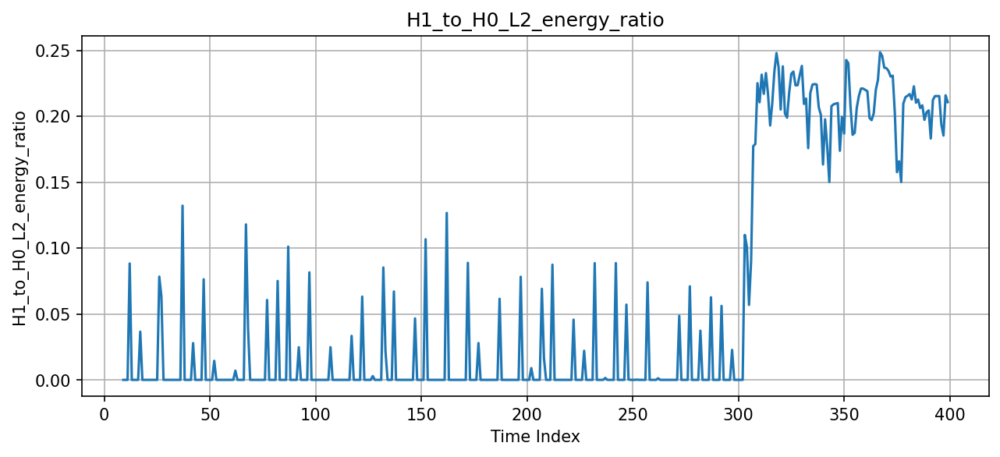

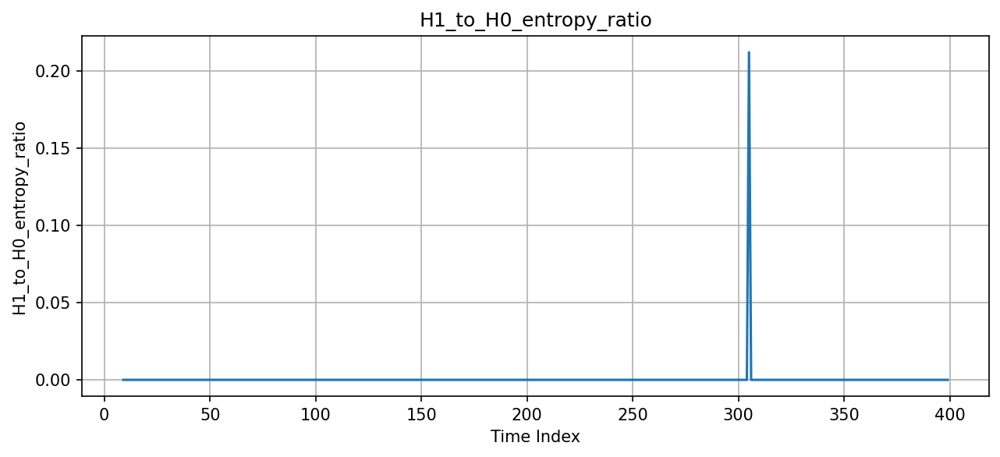

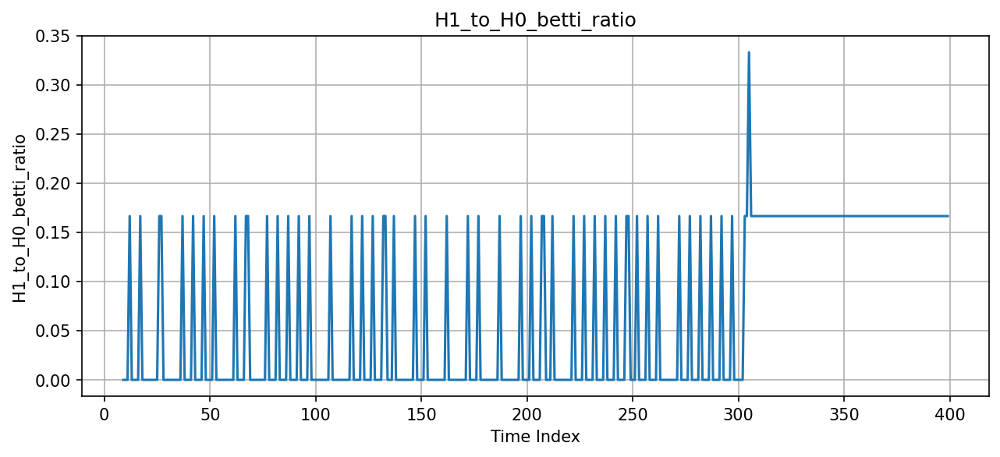

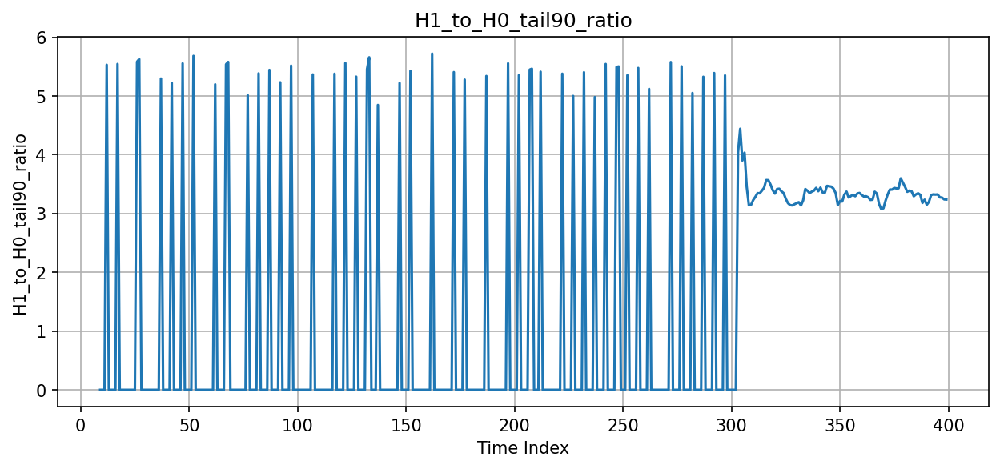


All plots saved in: tda_feature_plots
Movie created: tda_features_movie_1fps.mp4
Total frames: 87


In [123]:
import os
import numpy as np
import matplotlib.pyplot as plt
import imageio.v2 as imageio

# If needed (Colab):
# !pip -q install imageio imageio-ffmpeg

# -----------------------
# Settings
# -----------------------
out_dir = "tda_feature_plots"
movie_path = "tda_features_movie_1fps.mp4"
fps = 1                      # 1 second per plot
figsize = (10, 4)
dpi = 150

os.makedirs(out_dir, exist_ok=True)

# -----------------------
# Ensure DataFrame exists
# -----------------------
df_plot = tda_features_df.copy()

frame_paths = []
frame_id = 0

# -----------------------
# Loop through columns
# -----------------------
for col in df_plot.columns:

    # Skip non-numeric columns
    if not np.issubdtype(df_plot[col].dtype, np.number):
        print(f"Skipping non-numeric column: {col}")
        continue

    y = df_plot[col].values

    # Skip constant or empty columns
    if np.all(np.isnan(y)) or np.nanstd(y) == 0:
        print(f"Skipping constant / empty column: {col}")
        continue

    # -----------------------
    # Plot
    # -----------------------
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    ax.plot(y)
    ax.set_title(col)
    ax.set_xlabel("Time Index")
    ax.set_ylabel(col)
    ax.grid(True)

    # -----------------------
    # Save frame (NO tight layout → same size always)
    # -----------------------
    frame_path = os.path.join(out_dir, f"frame_{frame_id:04d}_{col}.png")
    fig.savefig(frame_path)
    frame_paths.append(frame_path)

    plt.show()        # still display
    plt.close(fig)

    frame_id += 1

# -----------------------
# Build MP4 movie
# -----------------------
with imageio.get_writer(
    movie_path,
    fps=fps,
    codec="libx264",
    macro_block_size=16   # avoids ffmpeg resizing issues
) as writer:
    for p in frame_paths:
        writer.append_data(imageio.imread(p))

print("\nAll plots saved in:", out_dir)
print("Movie created:", movie_path)
print("Total frames:", len(frame_paths))


In [124]:
from IPython.display import Video

# embed=True ensures the video is saved inside the notebook
Video("/content/tda_features_movie_1fps.mp4", embed=True)